<a href="https://colab.research.google.com/github/Darian-Lee-YTKA/mice_neuron_data_ml/blob/main/most_updated_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install rpy2

# Importing the data and converting from nested R lists to a data type native to python. Since the nested lists have different lengths, I will use a dictionary for now

In [2]:
import pandas as pd
from rpy2.robjects import pandas2ri

In [7]:
import rpy2.robjects as robjects
rdata = robjects.r['readRDS']('/content/session1.rds')

In [8]:
rdata1 = robjects.r['readRDS']('/content/session1.rds')


rdata2 = robjects.r['readRDS']('/content/session2.rds')


rdata3 = robjects.r['readRDS']('/content/session3.rds')


rdata4 = robjects.r['readRDS']('/content/session4.rds')


rdata5 = robjects.r['readRDS']('/content/session5.rds')


rdata6 = robjects.r['readRDS']('/content/session6.rds')


rdata7 = robjects.r['readRDS']('/content/session7.rds')


rdata8 = robjects.r['readRDS']('/content/session8.rds')


rdata9 = robjects.r['readRDS']('/content/session9.rds')


rdata10 = robjects.r['readRDS']('/content/session10.rds')


rdata11 = robjects.r['readRDS']('/content/session11.rds')


rdata12 = robjects.r['readRDS']('/content/session12.rds')


rdata13 = robjects.r['readRDS']('/content/session13.rds')


rdata14 = robjects.r['readRDS']('/content/session14.rds')


rdata15 = robjects.r['readRDS']('/content/session15.rds')


rdata16 = robjects.r['readRDS']('/content/session16.rds')


rdata17 = robjects.r['readRDS']('/content/session17.rds')


rdata18 = robjects.r['readRDS']('/content/session18.rds')

rdataTEST1 = robjects.r['readRDS']('/content/test1.rds')

rdataTEST2 = robjects.r['readRDS']('/content/test2.rds')


In [9]:
for name in rdata1.names:
    print(name)
    print(len(rdata1.rx2(name)))


contrast_left
114
contrast_right
114
feedback_type
114
mouse_name
1
brain_area
734
date_exp
1
spks
114
time
114


It seems like each of these sessions represent the measurements for 1 specific session. The mice are repeated accross sessions. I will explore the data a bit more for session1 with Cori.

In [10]:

import numpy as np
spks_data = rdata1.rx2('spks')

spks_array = np.array(spks_data)
spks_array.shape

# after analysing the data in R and talking to the professor, it seems that the
# 114 is the number of neurons, the 40 is the time, and the 734 is the brain area

trial1 = np.squeeze(spks_array[[0]]) # will get rid of 1 dimnesion
print(trial1.shape)
print(trial1[300].shape)
print(trial1[ :,3].shape)

# ok this make sense to me. We have 114 trials in each session. Each trial contains data from 114 neurons over 40 time intervals

(734, 40)
(40,)
(734,)


My idea is to have one column for each time stamp with the matrix at that time.

In [4]:
import numpy as np

Since the matrices represent the neurons at each time stamp for .4 seconds with no changes in stimuli, it makes sense to find the average across each row.

In [11]:
import matplotlib.pyplot as plt

class Neuron_instance:
  # a neuron in a specific trial situation
  def __init__(self, data, brain_area, kind, mother, session_id):
    self.data = data
    self.session_id = session_id # so that we can match up neurons across trials
    self.cluster = None
    self.brain_area = brain_area
    self.kind = kind
    #in case I need to go from neuron back to trial
    self.mother = mother
  def set_cluster(self, cluster):
    self.cluster = cluster



class Trial:
  def __init__(self, feedback, contrast_left, contrast_right, data, brain_area, mother, trial_id):
    self.data = data
    self.kind = None # for which contrast is higher and whether it was correct or incorrect
    self.full_kind = None # full kind including exact contrast values. I will only include it for true values because they will be more useful for clustering
    if feedback == 1:
      self.full_kind = [contrast_left, contrast_right] # remember, left comes first
    self.neurons = []

    # I don't expect most of the following attributes to be used. They are mainly included for debugging
    self.feedback = feedback
    self.cl = contrast_left
    self.cr = contrast_right

    # in case I need to go from a trial back to the session
    self.mother = mother

    # this will come in handy when I make my dataframe
    self.trial_id = trial_id

    # to set kind (kind is based on the kind of stimuli and feedback)
    if contrast_left > contrast_right:
      if feedback == 1:
        self.kind = "left true"
      else:
        self.kind = "left false"
    elif contrast_right > contrast_left:
      if feedback == 1:
        self.kind = "right true"
      else:
        self.kind = "right false"
    else:
      self.kind = "equal true"

    # to set the neurons (rows)
    counter = 0
    for row in data:
      self.neurons.append(Neuron_instance(row, brain_area[counter], self.kind, self, counter))
      counter += 1



  # for my own use when inspecting the data
  def plot_self(self):
      plt.imshow(self.data, aspect='auto', cmap='hot')
      plt.colorbar(label='Activity')
      string = "kind: " + self.kind
      plt.title(string)
      plt.show()







# after analysing the data in R and talking to the professor, it seems that the
# 114 is the number of neurons, the 40 is the time, and the 734 is the brain area

trial1 = np.squeeze(spks_array[[0]]) # will get rid of 1 dimnesion
print(trial1.shape)
print(trial1[300].shape)
print(trial1[ :,3].shape)

class Session:
  def __init__(self, matrix, feedback, contrast_left, contrast_right, index, brain_area):
    self.matrix = np.array(matrix)
    self.trials = []
    self.name = "sesh" + str(index)
    # I'm not sure if this will be important, but I'll include it just incase
    self.brain_area = list(brain_area)

    for trial_index in range(self.matrix.shape[0]):
      current_trial = np.squeeze(self.matrix[[trial_index]])
      current_feedback = feedback[trial_index]
      current_CL = contrast_left[trial_index]
      current_CR = contrast_right[trial_index]
      temp_trial = Trial(current_feedback, current_CL, current_CR, current_trial, self.brain_area, self, self.name + "_" + str(trial_index))
      self.trials.append(temp_trial)

  def get_trial_full_kinds(self, query): # returns all trials in that session matching certain properties
    return [trial for trial in self.trials if trial.full_kind == query]

  def get_trial_kinds(self, query): # returns all trials in that session matching certain properties (which contrast is higher and true false)
    return [trial for trial in self.trials ]







(734, 40)
(40,)
(734,)


In [12]:
# just testing the code on one session
session1 = Session(rdata1.rx2('spks'), rdata1.rx2('feedback_type'), rdata1.rx2('contrast_left'), rdata1.rx2('contrast_right'), 1, rdata1.rx2('brain_area'))

In [13]:
session1.matrix.shape[0]

114

In [14]:
print(session1.trials[1].neurons[1].data.shape)
print(session1.trials[1].neurons[1].data)

(40,)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [15]:
len(session1.brain_area)

734

In [16]:
brain_areas = []
for neuron in session1.trials[0].neurons:
  brain_areas.append(neuron.brain_area)
print(len(brain_areas))


734


This is unexpected. It seems the number of neurons measured does not directly match up with the number of brain_areas

In [17]:
session1.matrix
print(session1.trials[7].data.shape) # working as expected

print(session1.trials[7].kind) # working as expected
print(session1.trials[7].neurons[1].mother.mother.name) # should return sesh1. Working as expected

print(session1.trials[0].neurons[0].brain_area) # the brain area of the first node from the first trial of the first session
print(session1.trials[0].neurons[1].brain_area) # the brain area of the second node from the first trial of the first session
print(len(session1.get_trial_full_kinds([.5,.25])))

# this should equal the total number of trials of type "right true"
# note this is because if the mouse got it wrong, trial.full_kind is None
print(len(session1.get_trial_full_kinds([0,.25]))+ len(session1.get_trial_full_kinds([0,.5])) + len(session1.get_trial_full_kinds([0,1]))+len(session1.get_trial_full_kinds([.25,.5])) + len(session1.get_trial_full_kinds([.25,1]))+ len(session1.get_trial_full_kinds([.5,1])))
print(len(session1.get_trial_kinds("right true")))

# nice!

(734, 40)
left true
sesh1
ACA
MOs
4
27
114


In [18]:
session1.matrix.shape

(114, 734, 40)

In [19]:
print(rdata1.rx2("mouse_name"))

[1] "Cori"



In [20]:
sessions = []
for i in range(1,19):
  rdata_instance = globals().get(f'rdata{i}')
  data = rdata_instance.rx2
  print(data("mouse_name")) # just to test that my code is getting the correct data
  temp_sesh = Session(data('spks'), data('feedback_type'), data('contrast_left'), data('contrast_right'), i, data('brain_area'))
  print(temp_sesh.matrix.shape[0])
  sessions.append(temp_sesh)

# get test data
for i in range(1,3):
  rdata_instance = globals().get(f'rdataTEST{i}')
  print('test', i)
  data = rdata_instance.rx2
  print(data("mouse_name")) # just to test that my code is getting the correct data
  temp_sesh = Session(data('spks'), data('feedback_type'), data('contrast_left'), data('contrast_right'), 'test'+ str(i), data('brain_area'))
  print(temp_sesh.matrix.shape[0])
  sessions.append(temp_sesh)

[1] "Cori"

114
[1] "Cori"

251
[1] "Cori"

228
[1] "Forssmann"

249
[1] "Forssmann"

254
[1] "Forssmann"

290
[1] "Forssmann"

252
[1] "Hench"

250
[1] "Hench"

372
[1] "Hench"

447
[1] "Hench"

342
[1] "Lederberg"

340
[1] "Lederberg"

300
[1] "Lederberg"

268
[1] "Lederberg"

404
[1] "Lederberg"

280
[1] "Lederberg"

224
[1] "Lederberg"

216
test 1
[1] "Cori"

100
test 2
[1] "Lederberg"

100


In [21]:
for session in sessions:
  print("\n\n\n\n new sesh just dropped")
  print(len(session.brain_area))
  brain_areas = []

  for neuron in session.trials[0].neurons:
    brain_areas.append(neuron.brain_area)
  print(len(brain_areas))





 new sesh just dropped
734
734




 new sesh just dropped
1070
1070




 new sesh just dropped
619
619




 new sesh just dropped
1769
1769




 new sesh just dropped
1077
1077




 new sesh just dropped
1169
1169




 new sesh just dropped
584
584




 new sesh just dropped
1157
1157




 new sesh just dropped
788
788




 new sesh just dropped
1172
1172




 new sesh just dropped
857
857




 new sesh just dropped
698
698




 new sesh just dropped
983
983




 new sesh just dropped
756
756




 new sesh just dropped
743
743




 new sesh just dropped
474
474




 new sesh just dropped
565
565




 new sesh just dropped
1090
1090




 new sesh just dropped
734
734




 new sesh just dropped
1090
1090


In [22]:
# to see if the brian areas are consistant across sessions
all_brian_areas = []
for session in sessions:
  brian_areas = list(session.brain_area)
  all_brian_areas.extend(brian_areas)

unique_brian_areas = set(all_brian_areas)
unique_brian_areas = list(unique_brian_areas)
print(len(unique_brian_areas))
print(unique_brian_areas[:10], "\n", print(unique_brian_areas[10:20]), "\n", print(unique_brian_areas[20:30]), "\n", print(unique_brian_areas[30:40]), "\n", print(unique_brian_areas[40:50]), "\n", print(unique_brian_areas[50:60]))



62
['ZI', 'MG', 'VISa', 'LD', 'EPd', 'POL', 'VPM', 'ILA', 'TH', 'ORBm']
['SCm', 'VISrl', 'AUD', 'MD', 'PT', 'CA3', 'SPF', 'VISl', 'PL', 'SCsg']
['RT', 'POST', 'BLA', 'OLF', 'CP', 'SUB', 'PO', 'MRN', 'OT', 'PAG']
['PIR', 'MS', 'LH', 'SI', 'VISpm', 'CA1', 'VISam', 'MEA', 'MOp', 'LSc']
['SNr', 'DG', 'LP', 'ACB', 'MB', 'MOs', 'TT', 'NB', 'ORB', 'RSP']
['VISp', 'SSp', 'RN', 'LS', 'SSs', 'VPL', 'GPe', 'root', 'SCs', 'LSr'] 
 None 
 None 
 None 
 None 
 None


I think the brain areas may be able to tell us something useful. At the very least, they can clue us into how many clusters we might need

In [23]:
for session in sessions:
  print("\n\n\n\n new sesh just dropped")
  for neuron in session.trials[0].neurons[:5]:
    print(neuron.brain_area)





 new sesh just dropped
ACA
MOs
ACA
LS
MOs




 new sesh just dropped
CA1
VISl
root
root
CA1




 new sesh just dropped
DG
VISam
MG
VISam
VISam




 new sesh just dropped
LGd
DG
TH
LGd
LGd




 new sesh just dropped
VISa
VISa
root
root
VISa




 new sesh just dropped
AUD
AUD
AUD
root
root




 new sesh just dropped
VPL
root
CA3
VPL
VPL




 new sesh just dropped
ILA
TT
ILA
MOs
ILA




 new sesh just dropped
TT
ORBm
TT
ORBm
ORBm




 new sesh just dropped
MB
MB
VISp
MB
MB




 new sesh just dropped
MOp
MOp
LSc
MOp
MOp




 new sesh just dropped
VISp
VISp
VISp
DG
VISp




 new sesh just dropped
VISam
VISam
ZI
DG
DG




 new sesh just dropped
ORB
MOs
ORB
MOs
ORB




 new sesh just dropped
BLA
BLA
GPe
BLA
BLA




 new sesh just dropped
SSs
SSs
SSs
SSs
SSs




 new sesh just dropped
root
root
VPL
root
root




 new sesh just dropped
CP
CP
CP
ACB
ACB




 new sesh just dropped
ACA
MOs
ACA
LS
MOs




 new sesh just dropped
CP
CP
CP
ACB
ACB


I do not fully understand how this data is organized, so I will procede using clustering and then perhaps compare the clustered data to these labels

sesh1


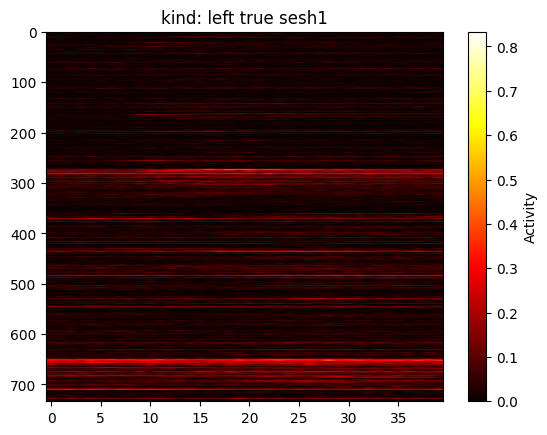

sesh1


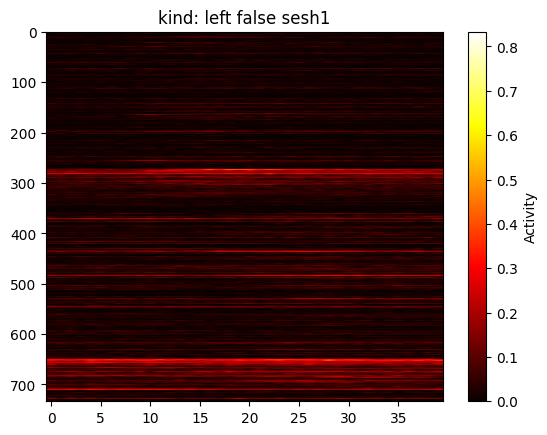

sesh1


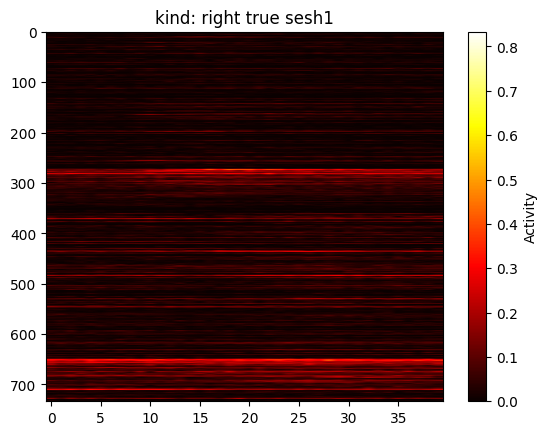

sesh1


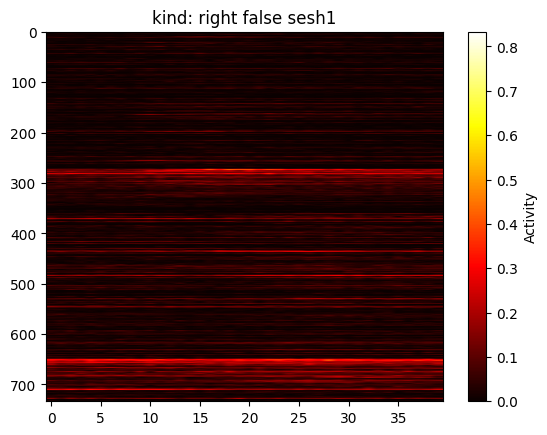

sesh1


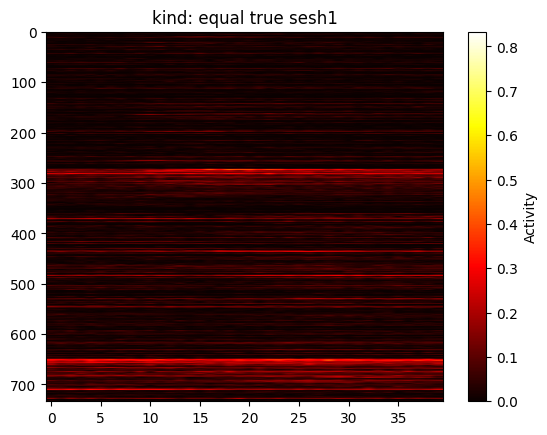

sesh2


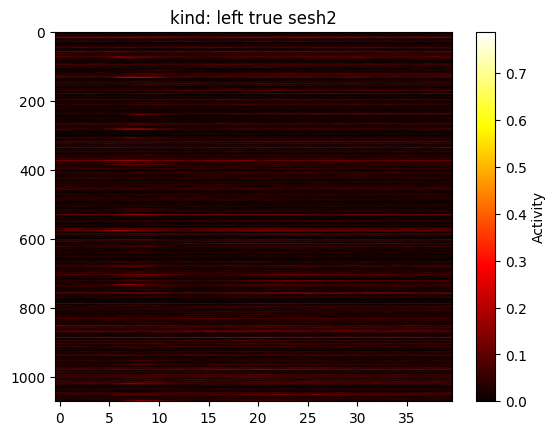

sesh2


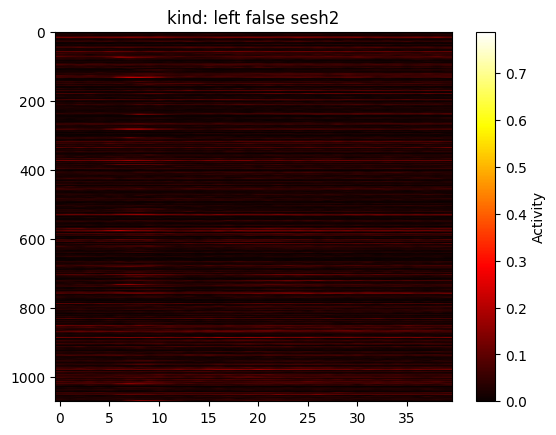

sesh2


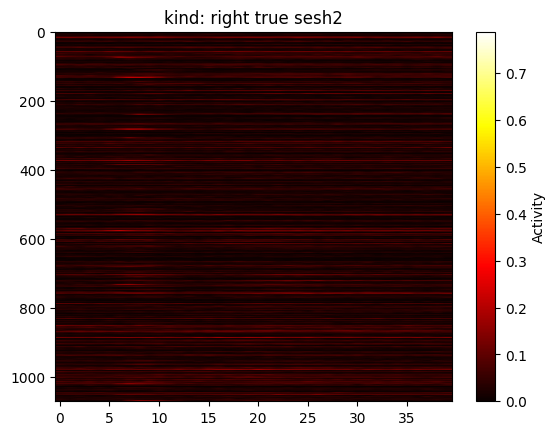

sesh2


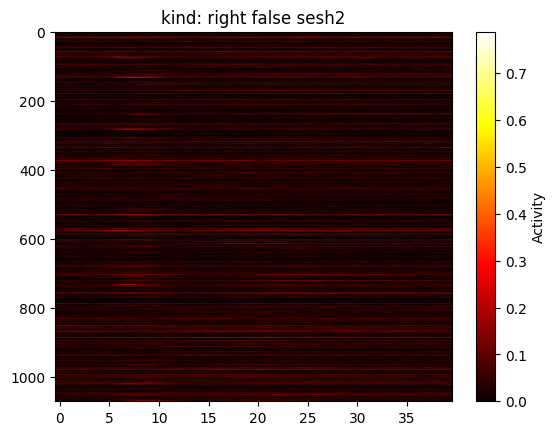

sesh2


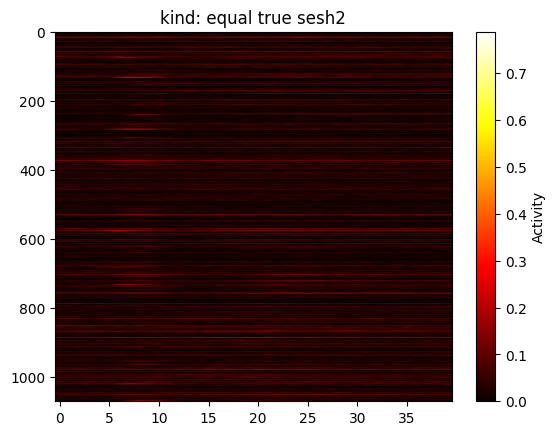

sesh3


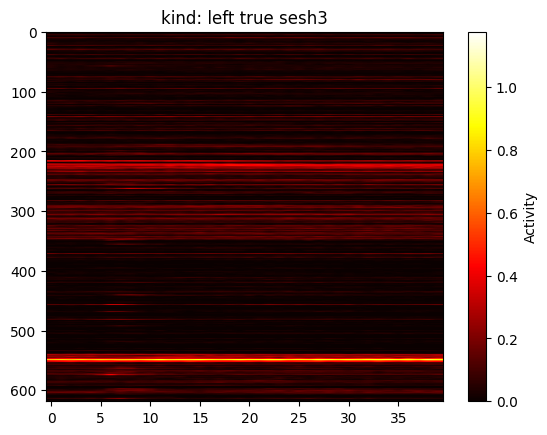

sesh3


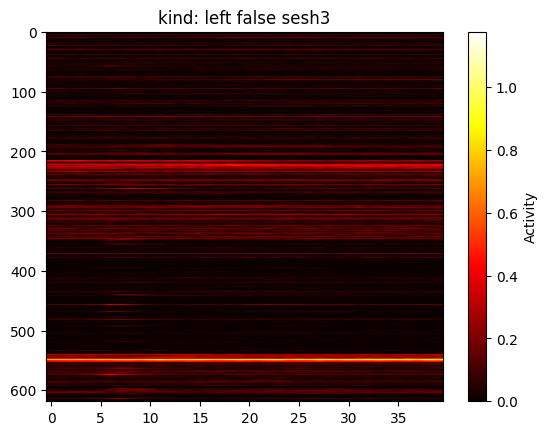

sesh3


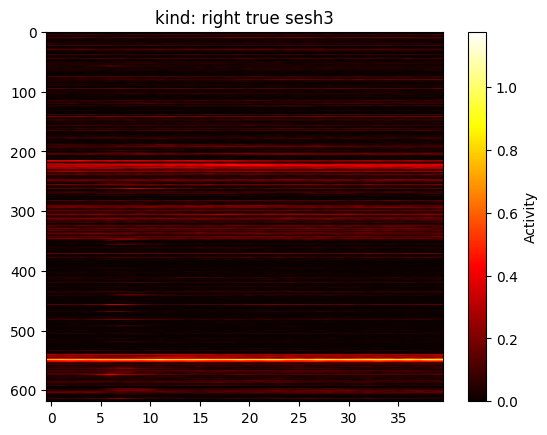

sesh3


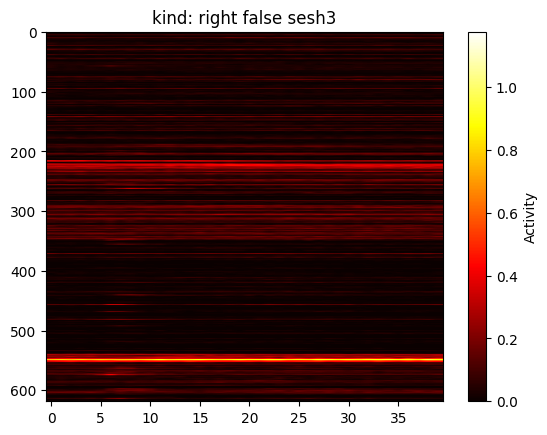

sesh3


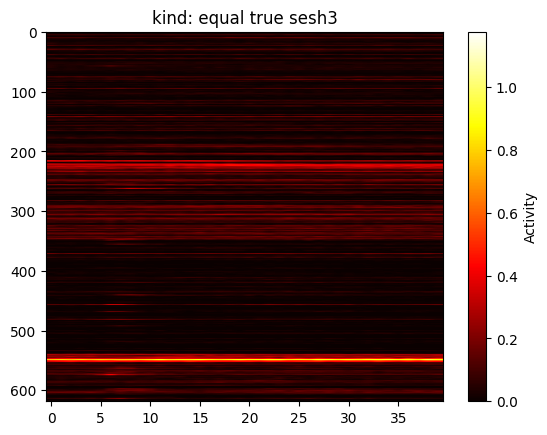

sesh4


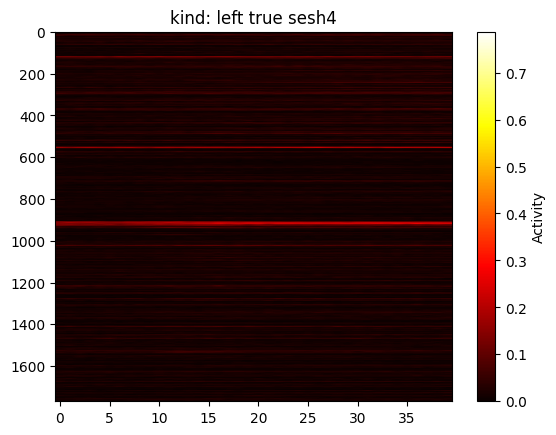

sesh4


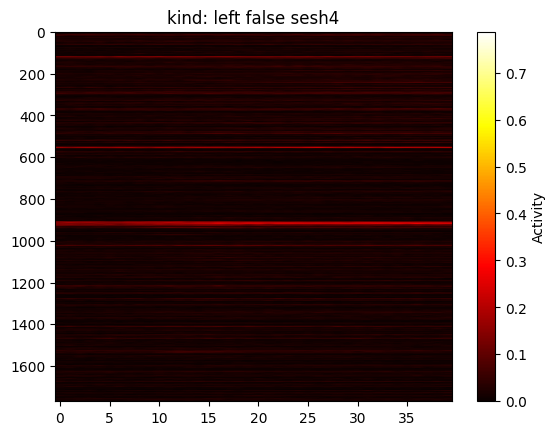

sesh4


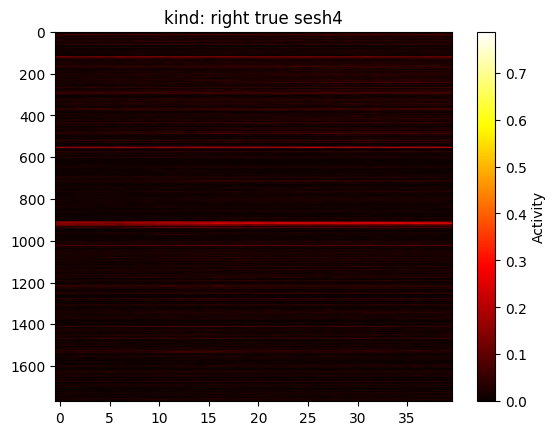

sesh4


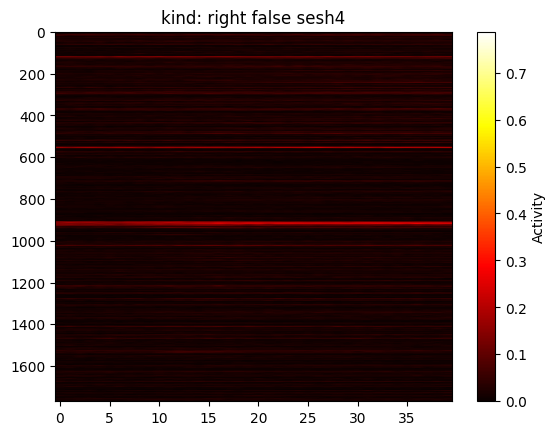

sesh4


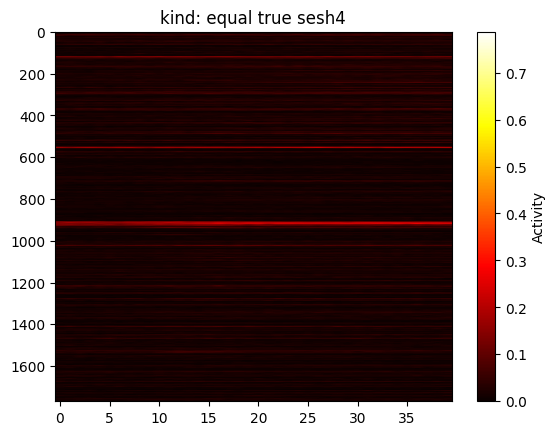

sesh5


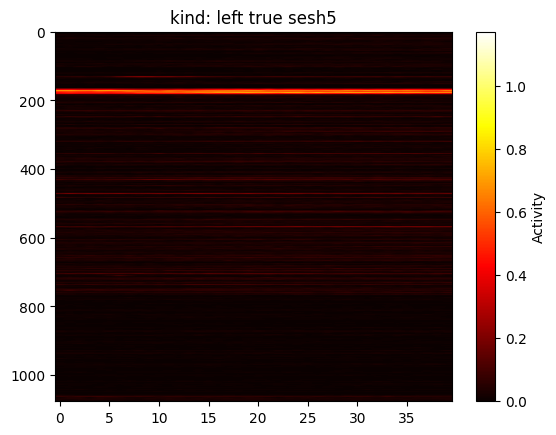

sesh5


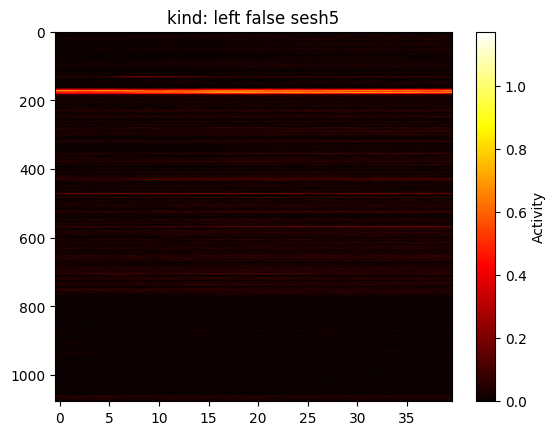

sesh5


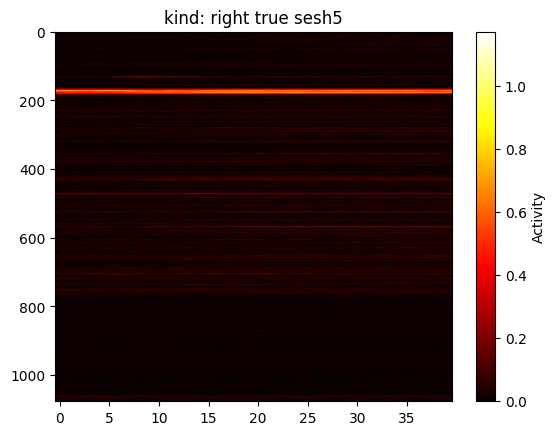

sesh5


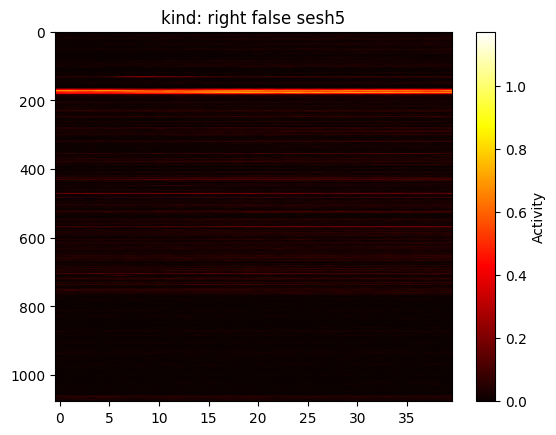

sesh5


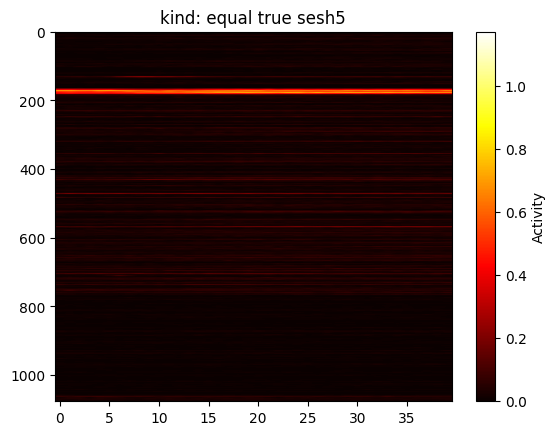

sesh6


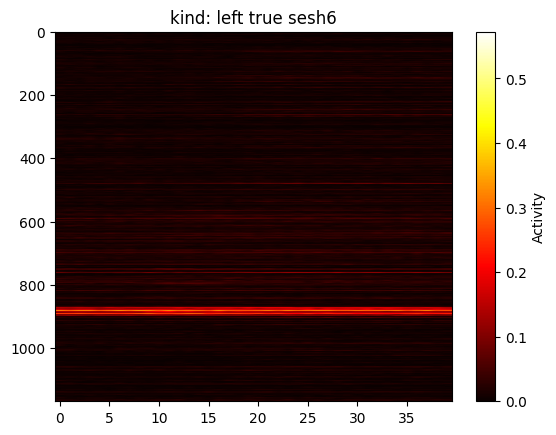

sesh6


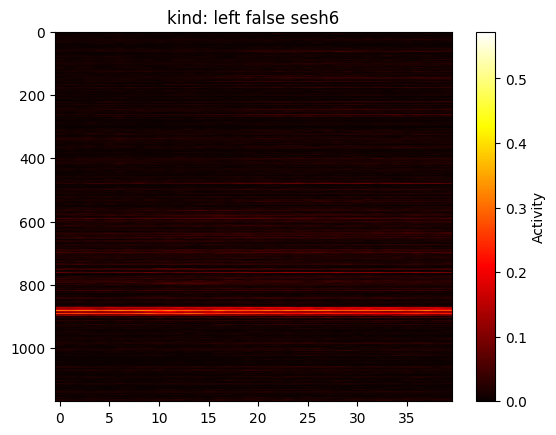

sesh6


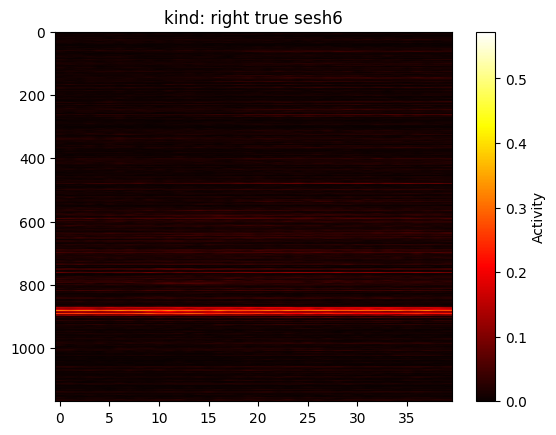

sesh6


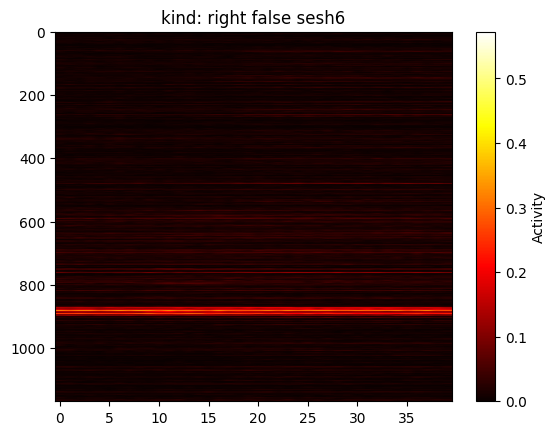

sesh6


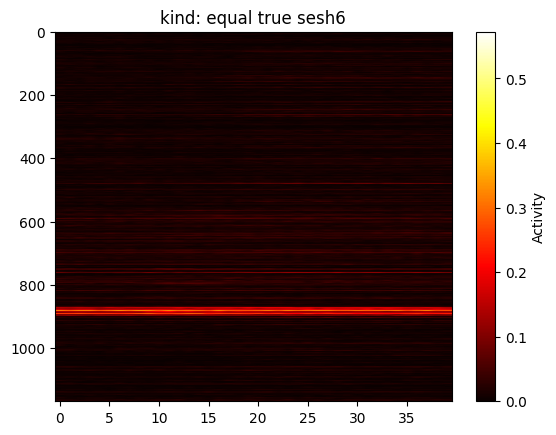

sesh7


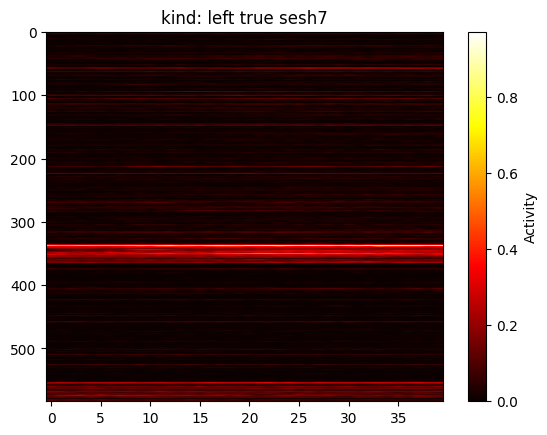

sesh7


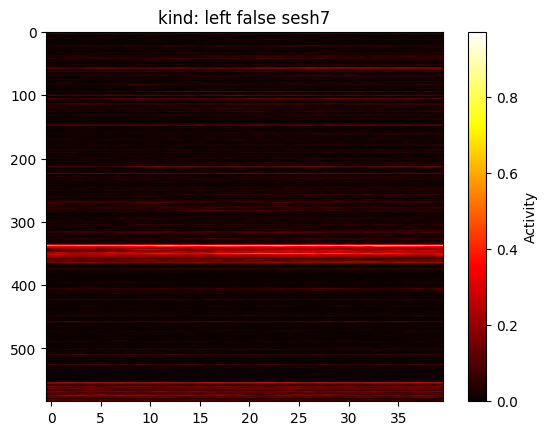

sesh7


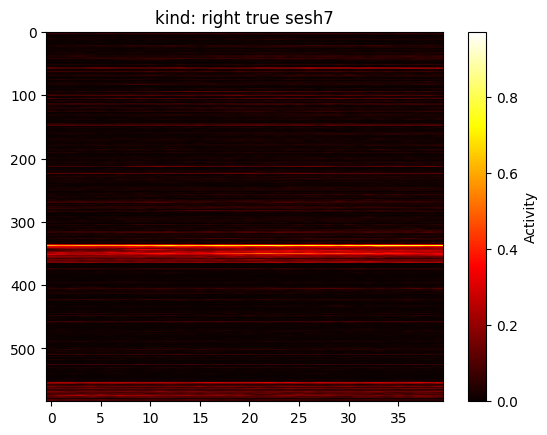

sesh7


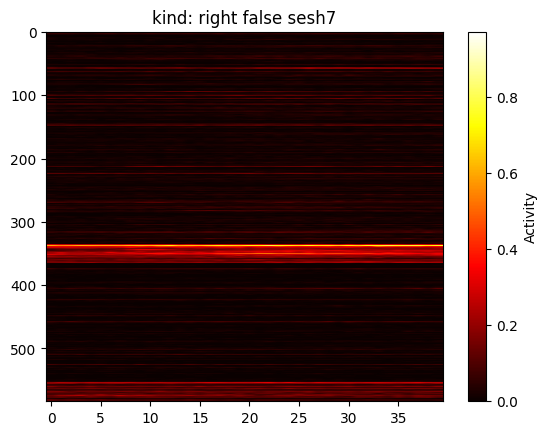

sesh7


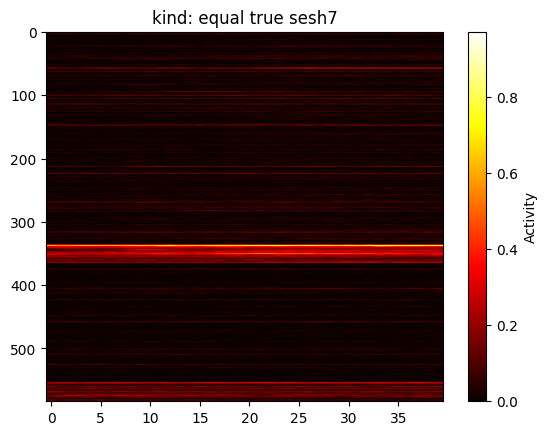

sesh8


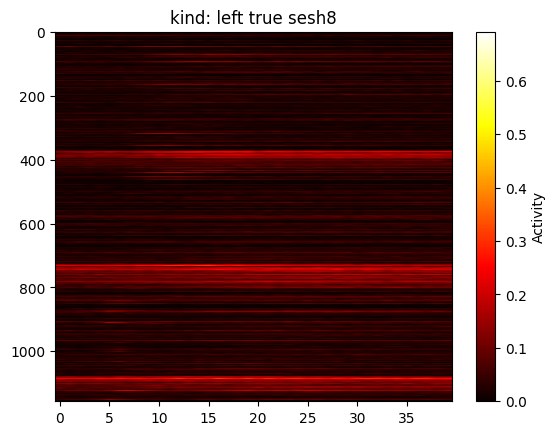

sesh8


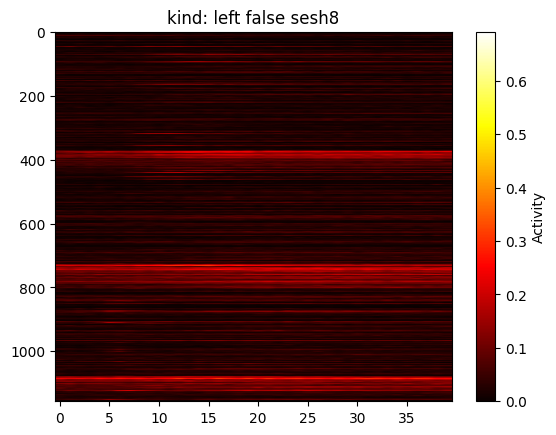

sesh8


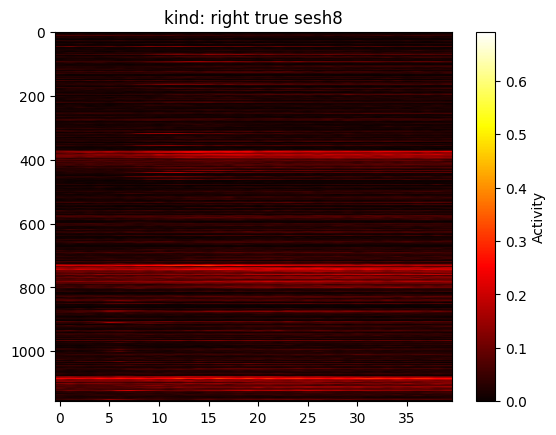

sesh8


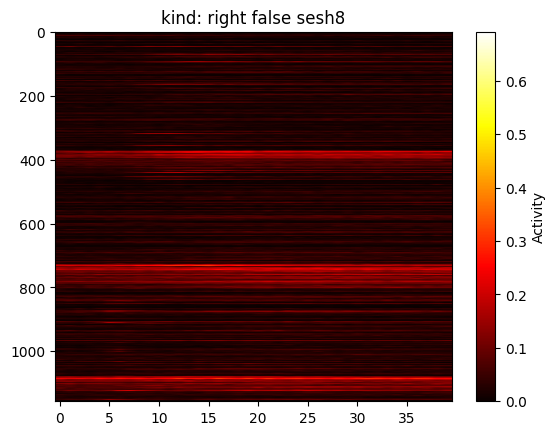

sesh8


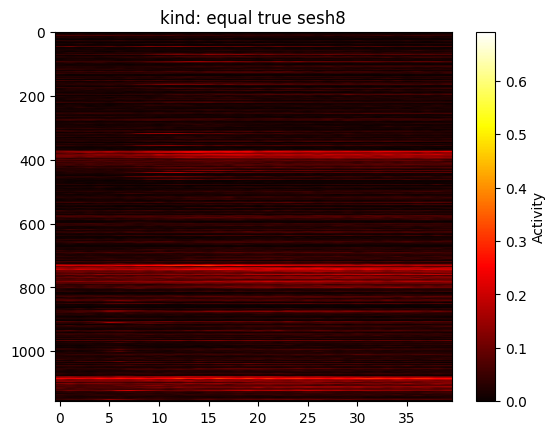

sesh9


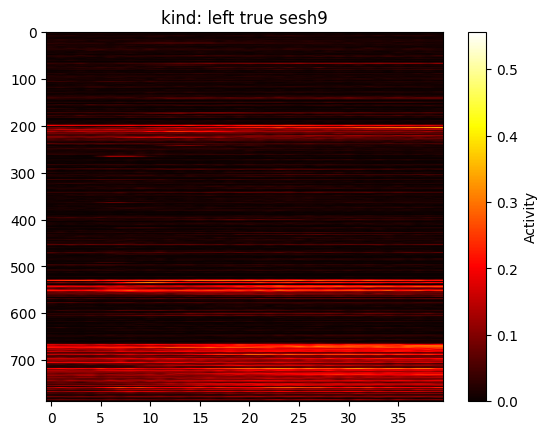

sesh9


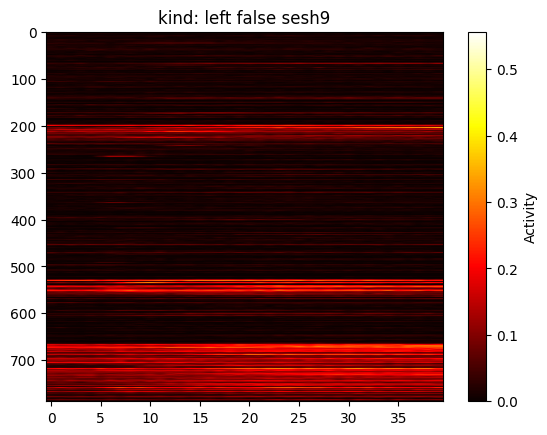

sesh9


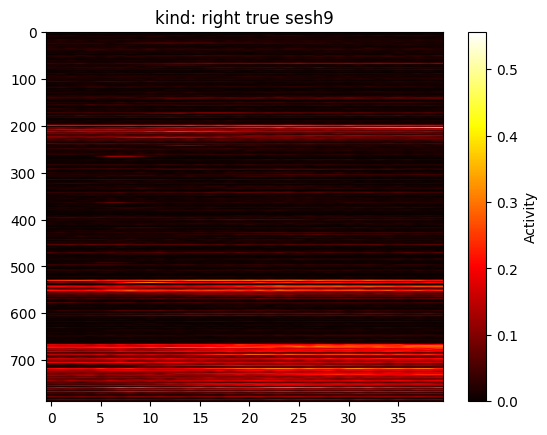

sesh9


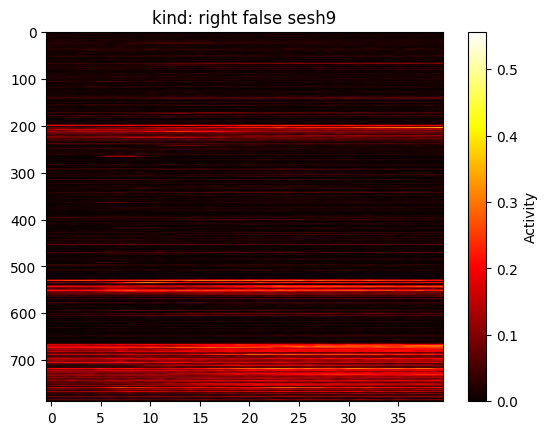

sesh9


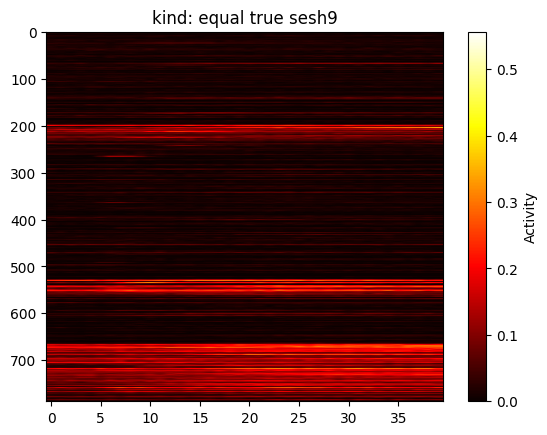

sesh10


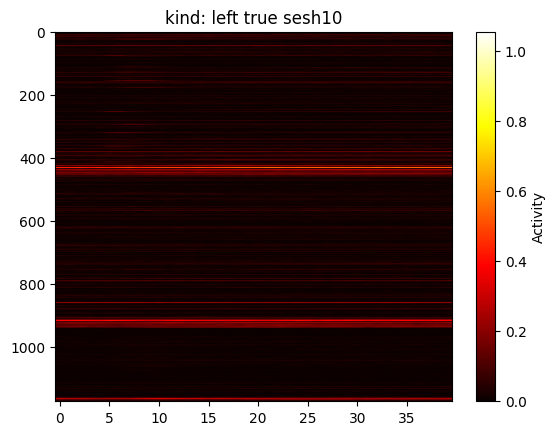

sesh10


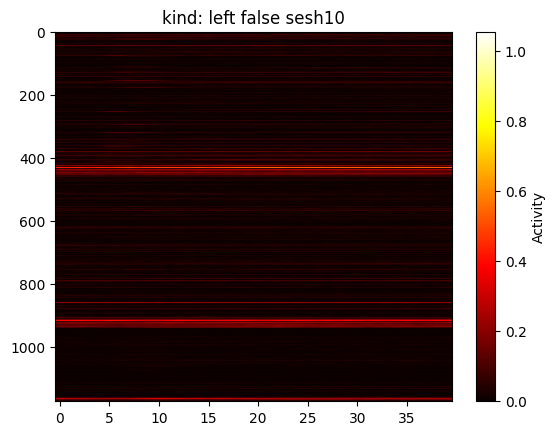

sesh10


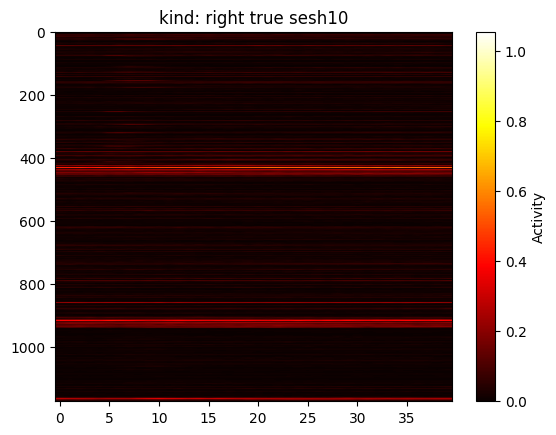

sesh10


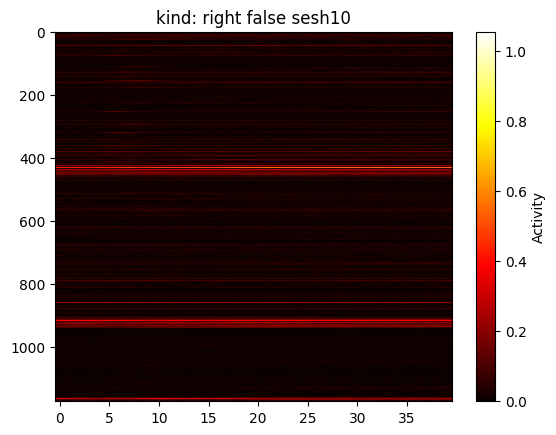

sesh10


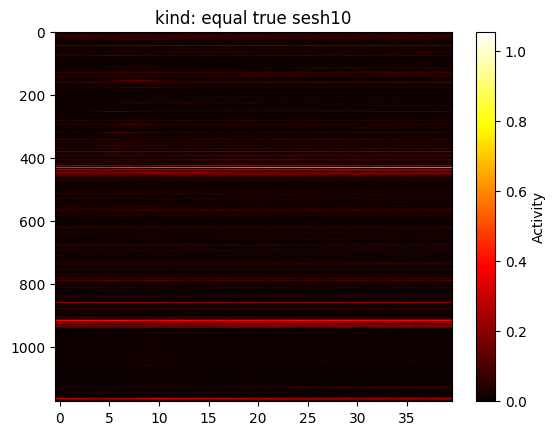

sesh11


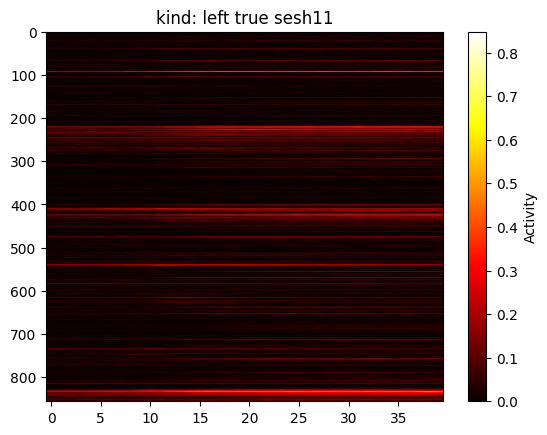

sesh11


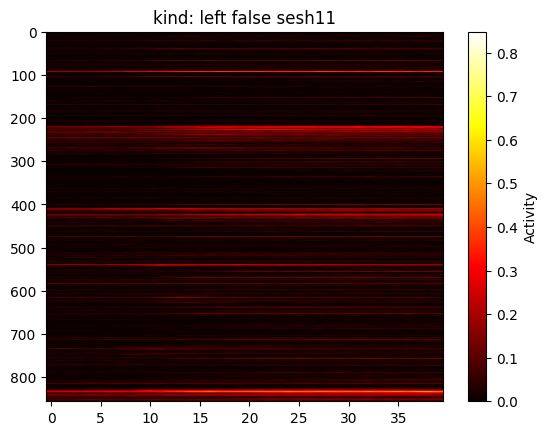

sesh11


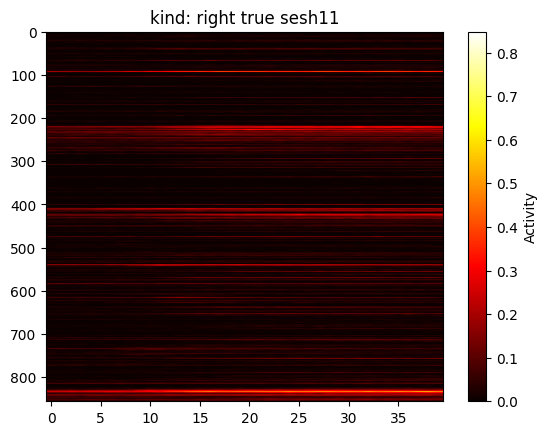

sesh11


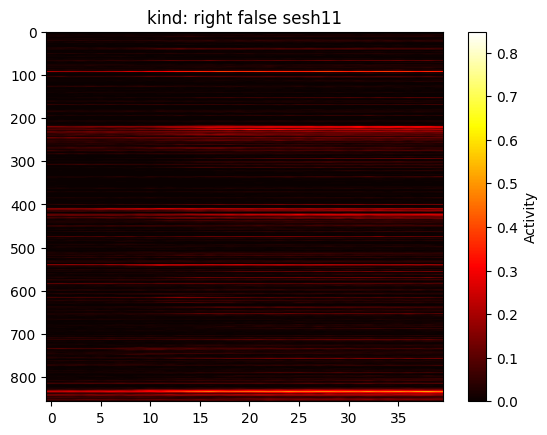

sesh11


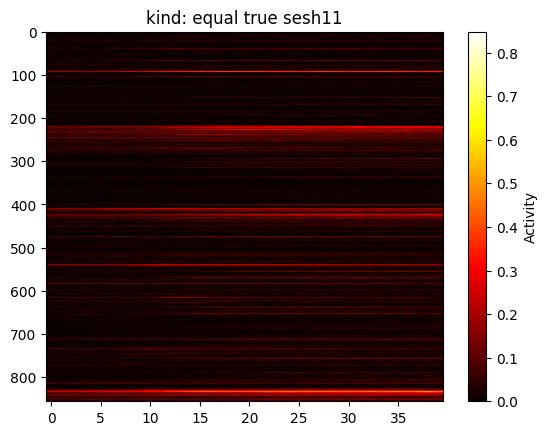

sesh12


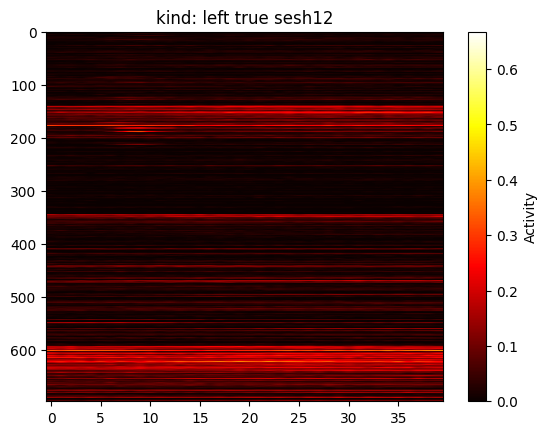

sesh12


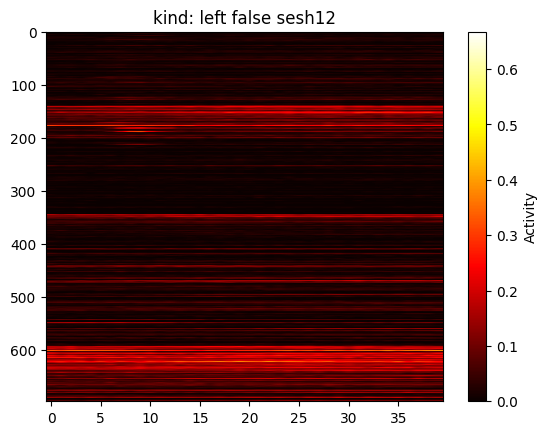

sesh12


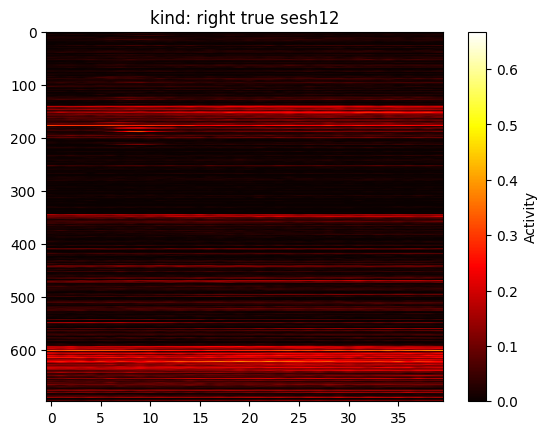

sesh12


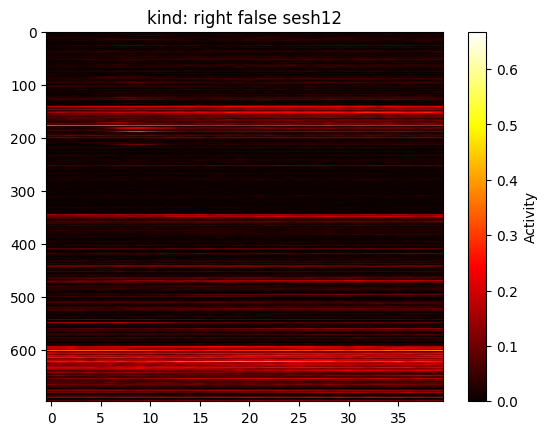

sesh12


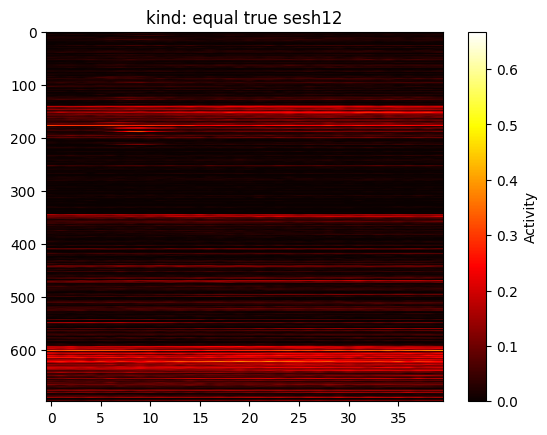

sesh13


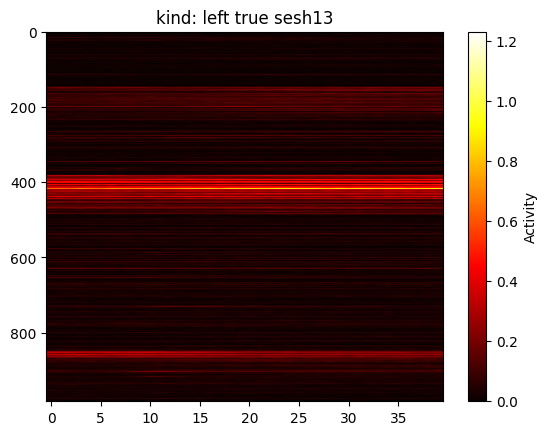

sesh13


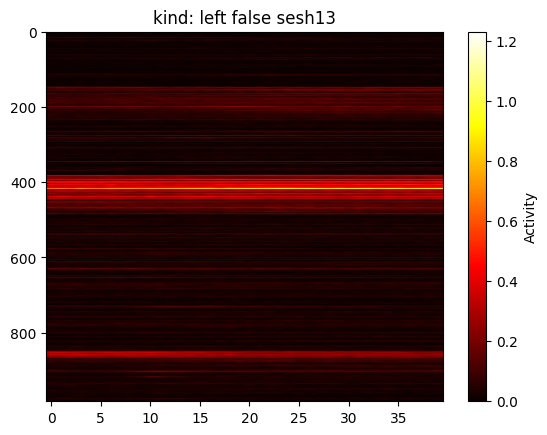

sesh13


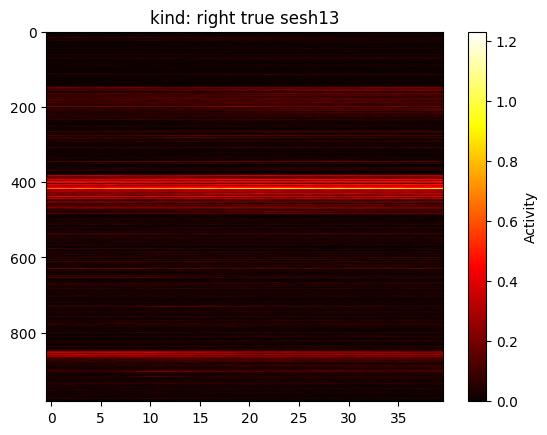

sesh13


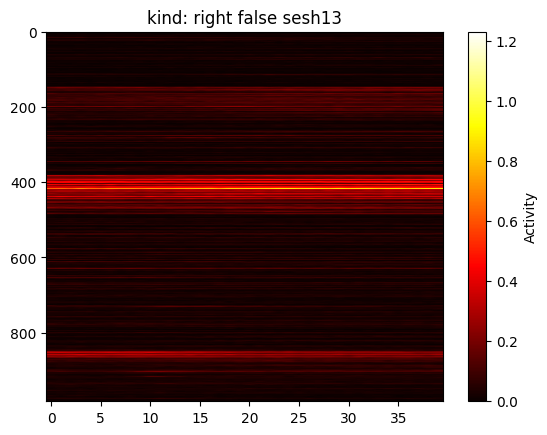

sesh13


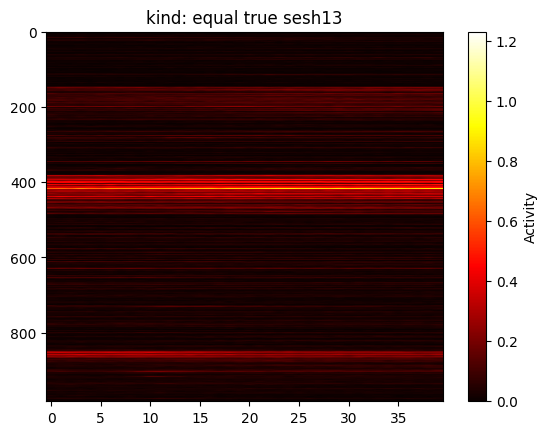

sesh14


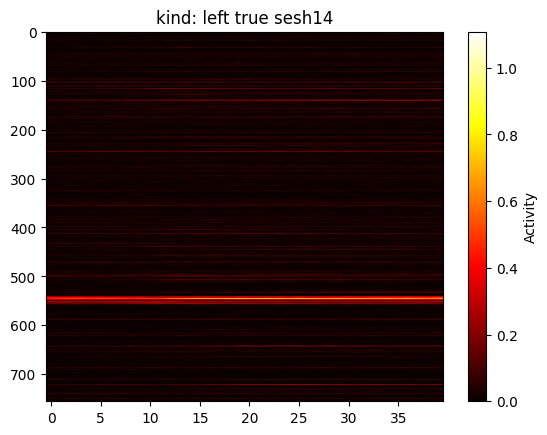

sesh14


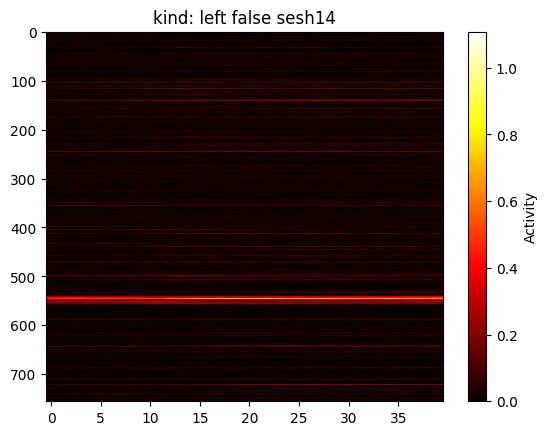

sesh14


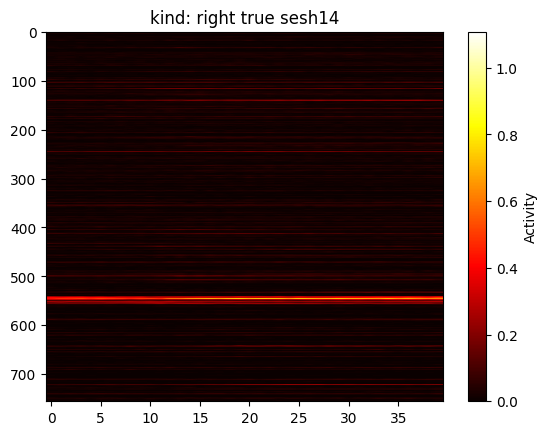

sesh14


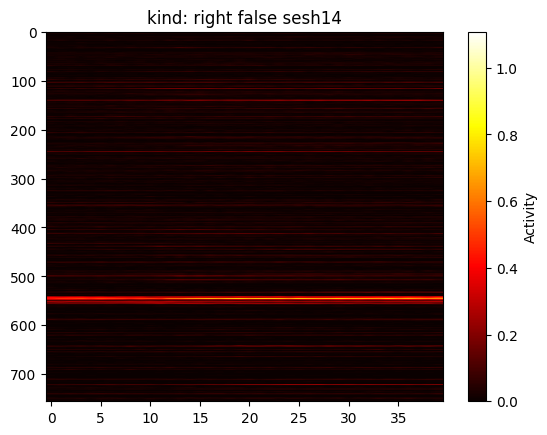

sesh14


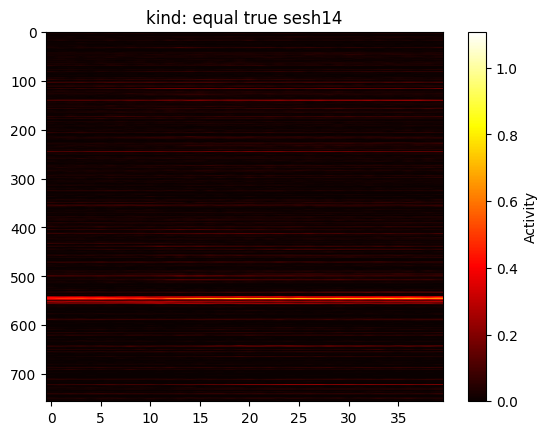

sesh15


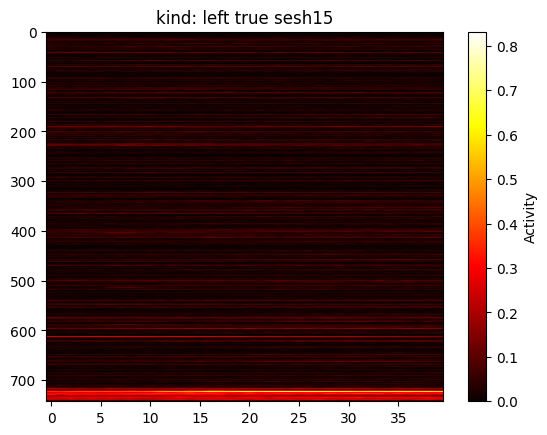

sesh15


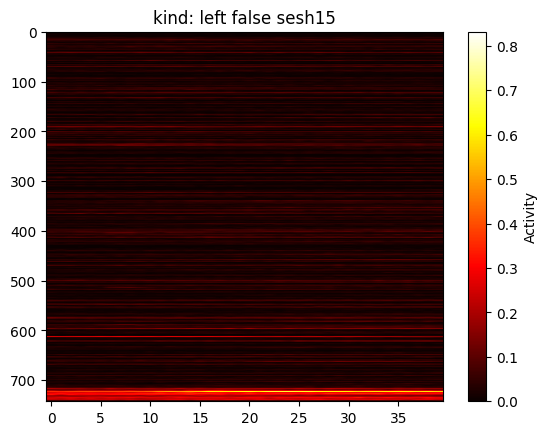

sesh15


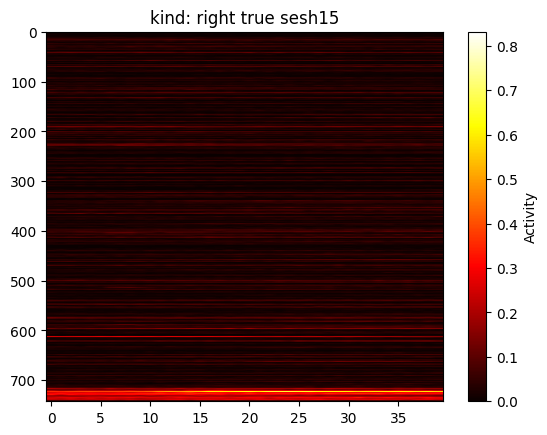

sesh15


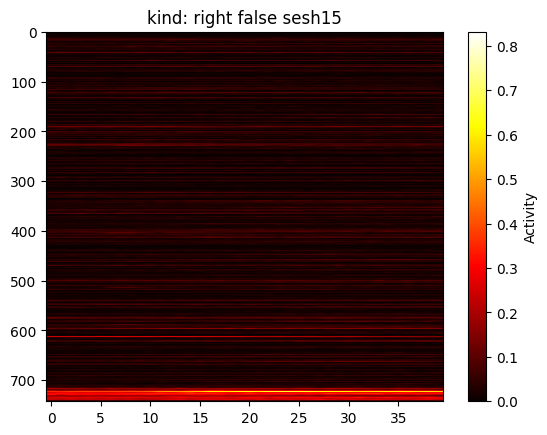

sesh15


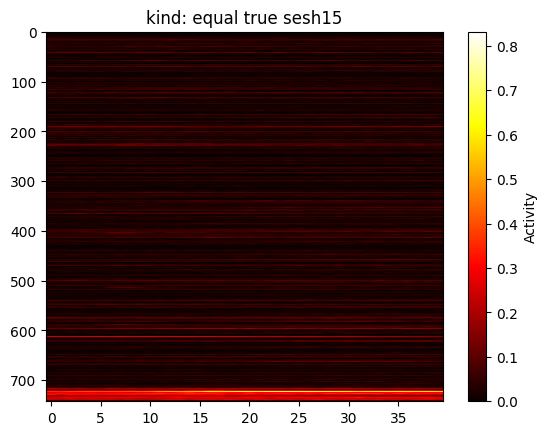

sesh16


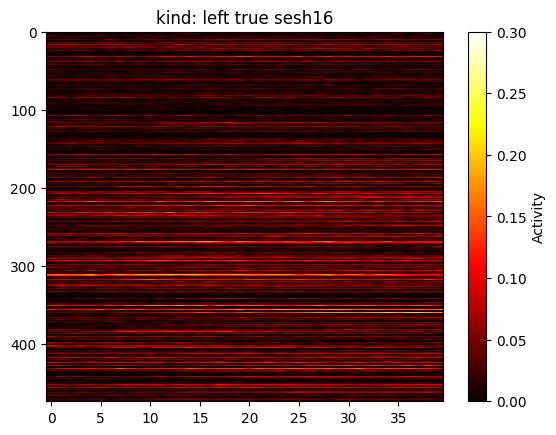

sesh16


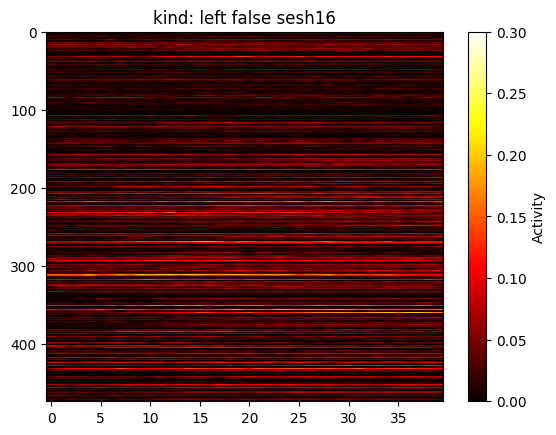

sesh16


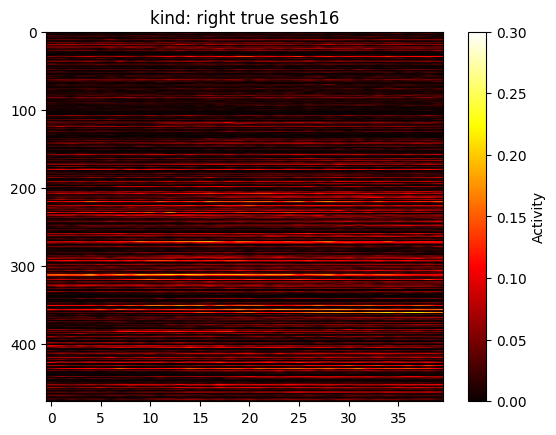

sesh16


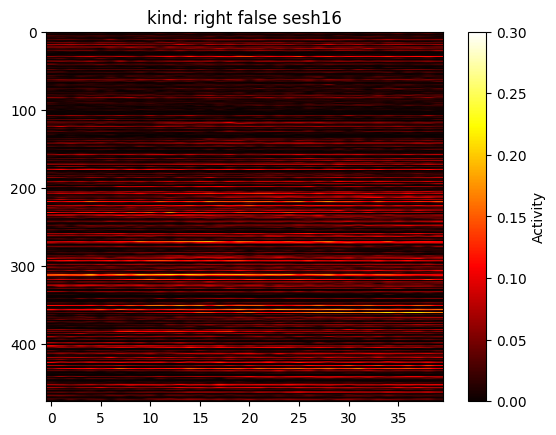

sesh16


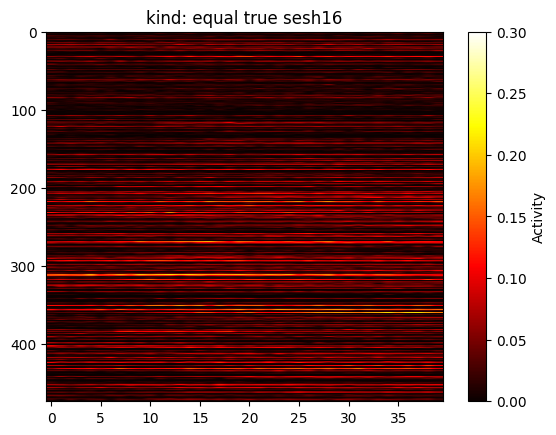

sesh17


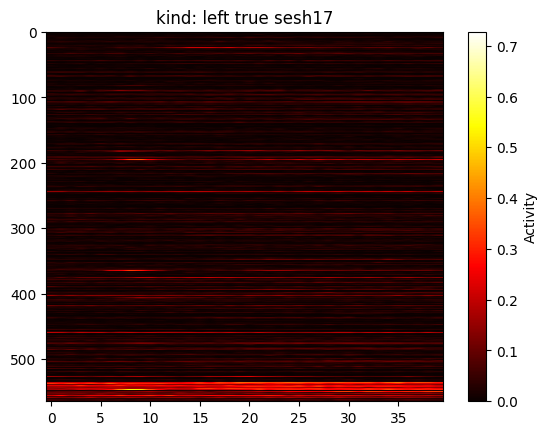

sesh17


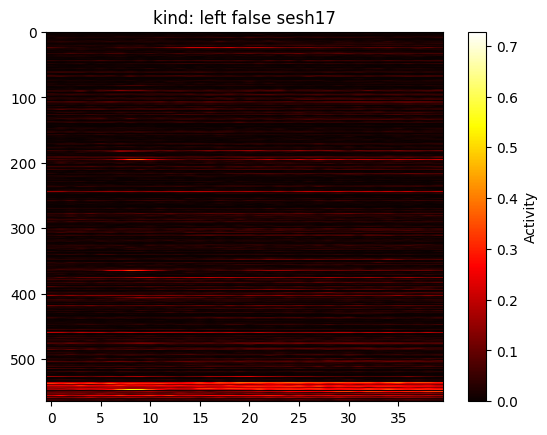

sesh17


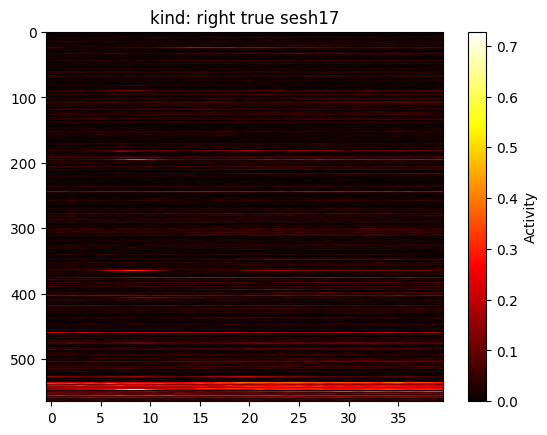

sesh17


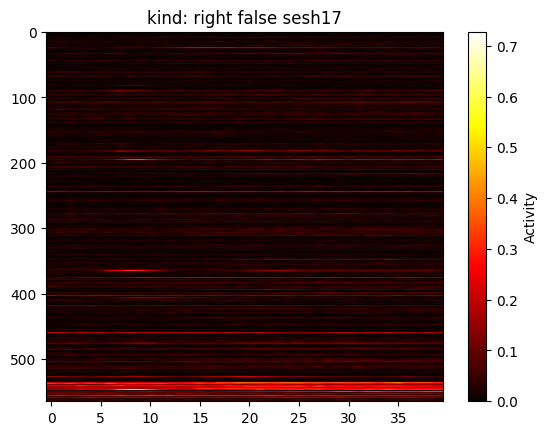

sesh17


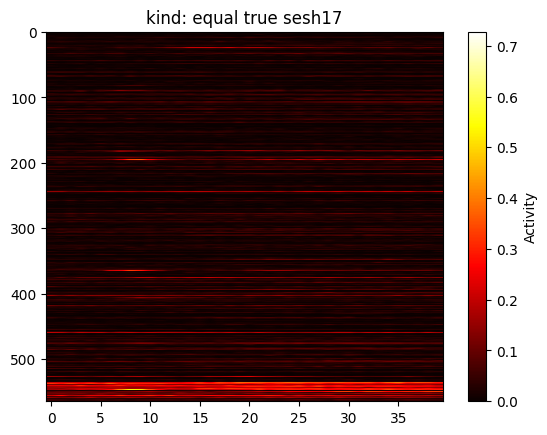

sesh18


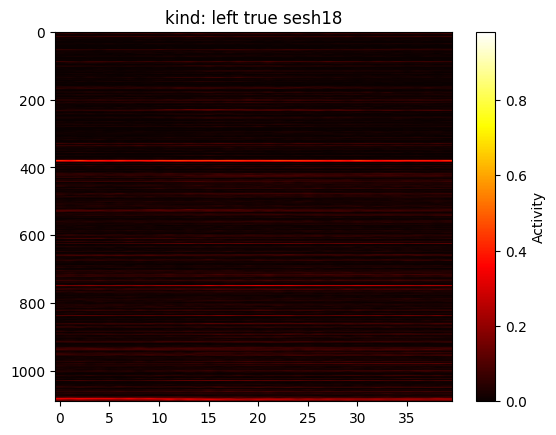

sesh18


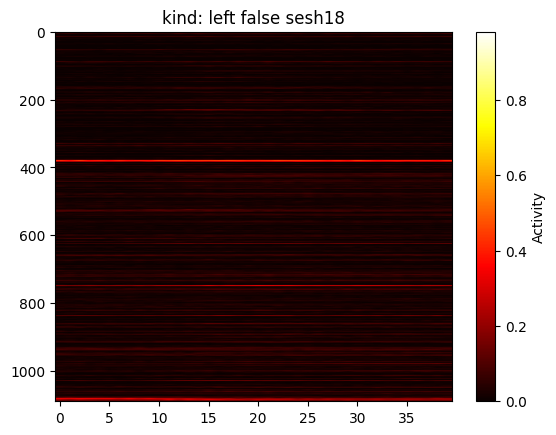

sesh18


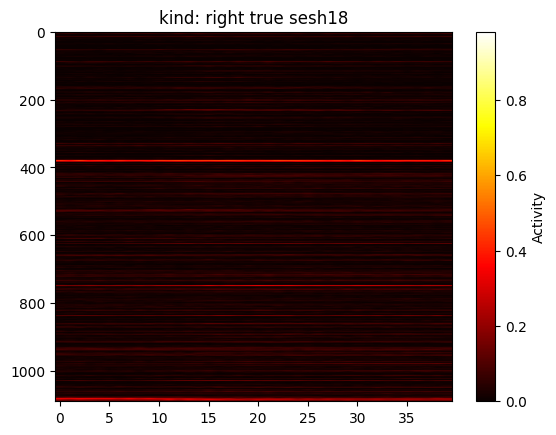

sesh18


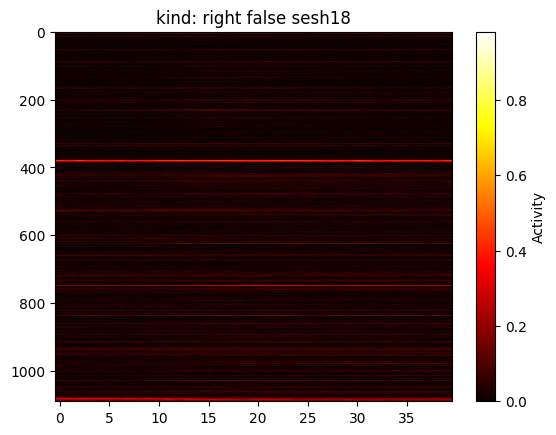

sesh18


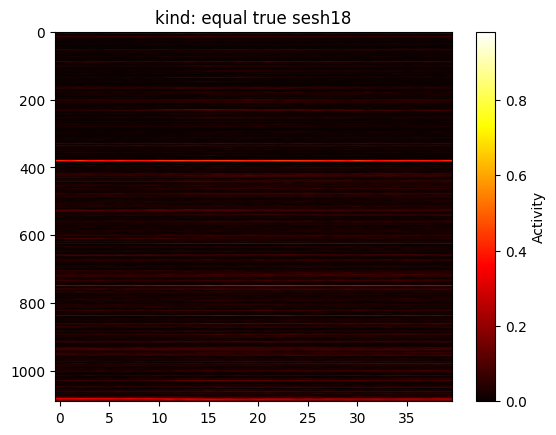

seshtest1


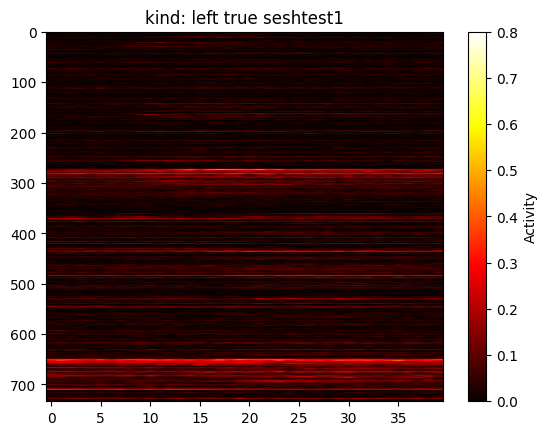

seshtest1


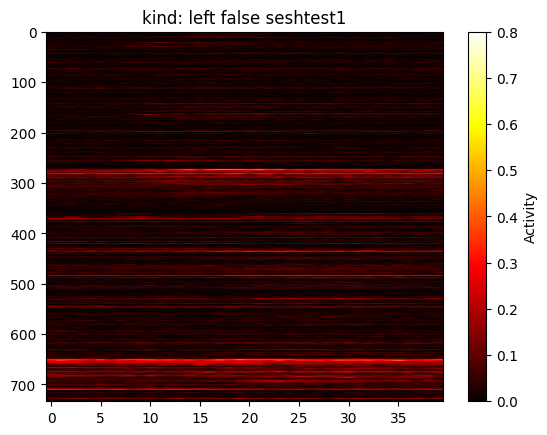

seshtest1


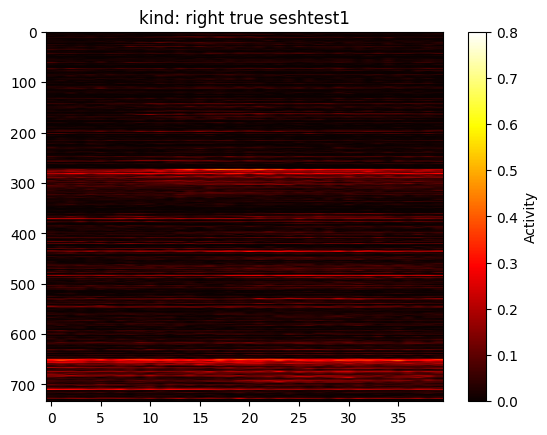

seshtest1


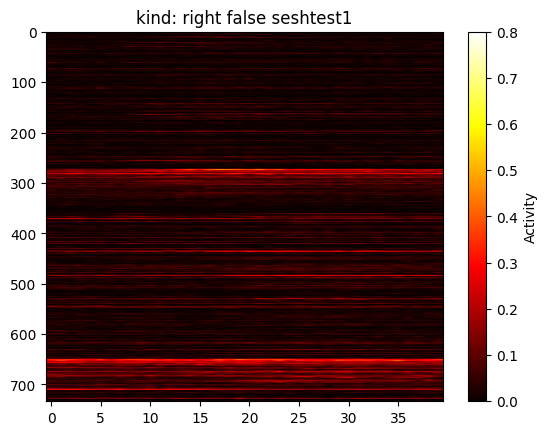

seshtest1


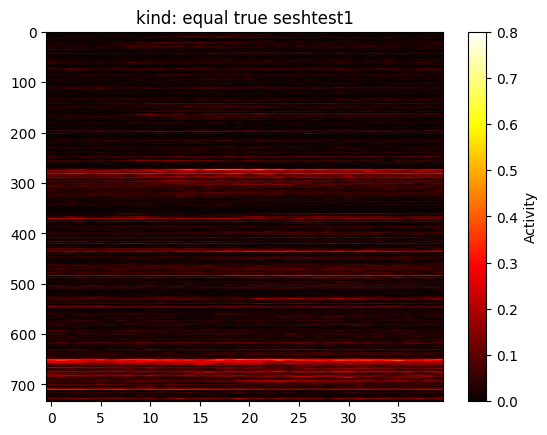

seshtest2


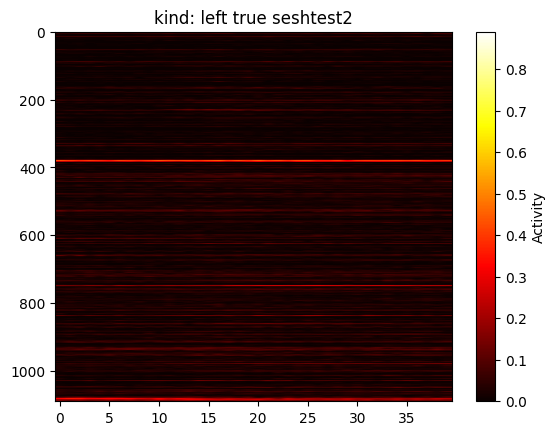

seshtest2


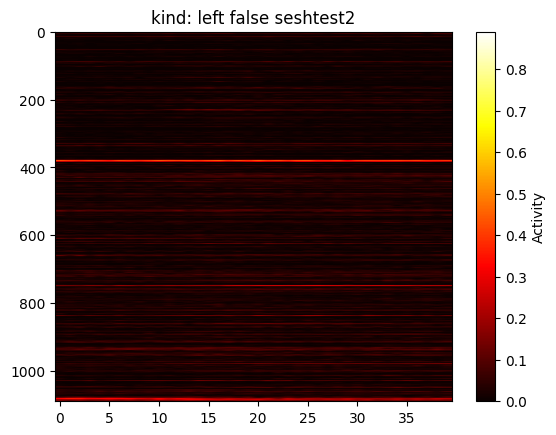

seshtest2


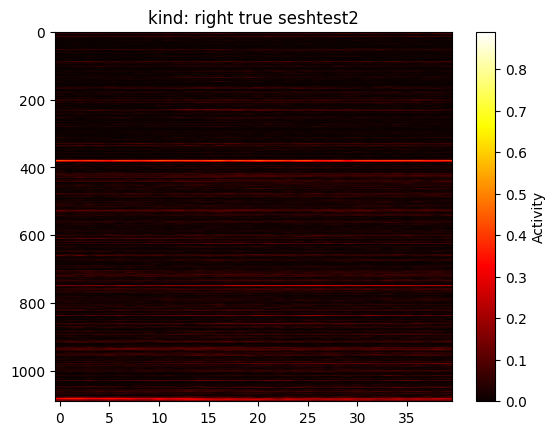

seshtest2


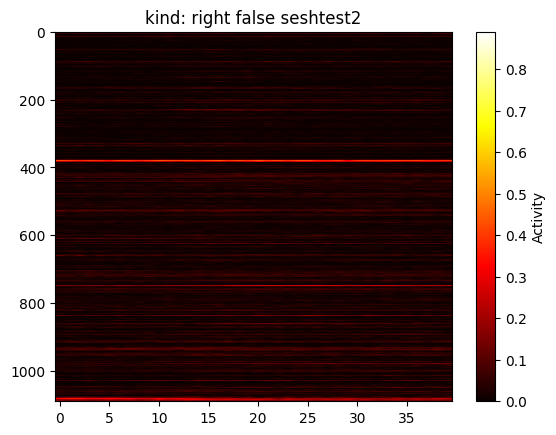

seshtest2


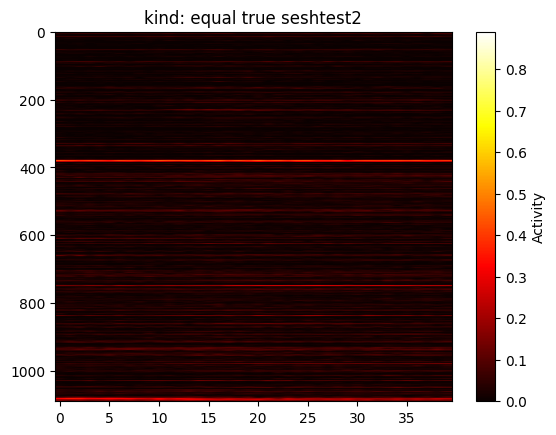

In [24]:
# There are going to be a lot of matrices, so I will plot the average for each type across each session


for session in sessions:
  kinds = ["left true", "left false", "right true", "right false", "equal true"]
  kinds_data = [[] for i in range(len(kinds))]

  for i in range(len(kinds)):
    #print(kinds[i])
    #print(session.get_trial_kinds(kinds[i]))
    kinds_data[i].extend(session.get_trial_kinds(kinds[i]))


  counter = 0
  for kind in kinds_data:
    #print(len(kind))
    if len(kind) < 2:
      continue # we can't stack less than 2 matrices
    stacked_matrices = np.stack([trial.data for trial in kind])
    mean_across_matrices = np.mean(stacked_matrices, axis=0)
    print(session.name)
    plt.imshow(mean_across_matrices, aspect='auto', cmap='hot')
    plt.colorbar(label='Activity')
    string = "kind: " + kinds[counter] + " " + session.name
    counter += 1
    plt.title(string)
    plt.show()




Some observations:
- The graphs of average neurons differ greatly between sessions, and comparing them between sessions may not be reliable to begin with because of different neurons from different brain areas being selected, which we saw earlier

- Unfortuantely there are no stark noticable differences between left true and right true within sessions

- The graph also suggests the presence of "noisy" neurons which are always activated and may not porvide much useful information


In [25]:
# to see if the brian areas are consistant across sessions
all_brian_areas = []
for session in sessions:
  brian_areas = list(session.brain_area)
  all_brian_areas.extend(brian_areas)

unique_brian_areas = set(all_brian_areas)
unique_brian_areas = list(unique_brian_areas)
print(len(unique_brian_areas))
print(unique_brian_areas[:10], "\n", print(unique_brian_areas[10:20]), "\n", print(unique_brian_areas[20:30]), "\n", print(unique_brian_areas[30:40]), "\n", print(unique_brian_areas[40:50]), "\n", print(unique_brian_areas[50:60]))



62
['ZI', 'MG', 'VISa', 'LD', 'EPd', 'POL', 'VPM', 'ILA', 'TH', 'ORBm']
['SCm', 'VISrl', 'AUD', 'MD', 'PT', 'CA3', 'SPF', 'VISl', 'PL', 'SCsg']
['RT', 'POST', 'BLA', 'OLF', 'CP', 'SUB', 'PO', 'MRN', 'OT', 'PAG']
['PIR', 'MS', 'LH', 'SI', 'VISpm', 'CA1', 'VISam', 'MEA', 'MOp', 'LSc']
['SNr', 'DG', 'LP', 'ACB', 'MB', 'MOs', 'TT', 'NB', 'ORB', 'RSP']
['VISp', 'SSp', 'RN', 'LS', 'SSs', 'VPL', 'GPe', 'root', 'SCs', 'LSr'] 
 None 
 None 
 None 
 None 
 None


Starting with the first 10:

**TT: Taenia tecta**:

 https://www.sciencedirect.com/topics/medicine-and-dentistry/tenia-tecta
My analysis reveals it mostly attributed to odor processing. Thus it may not be relevant in processing visual information. Knowing about neural plasticity, in certain cases it may be relevant to visual processing. But as of now, it seems unlikely to be directly involved

**OLF olfacory**

https://www.physio-pedia.com/Olfactory_Cortex#:~:text=Olfactory%20Cortex%3A,to%20our%20memories%20and%20emotions.

Mainly used in processing odors as well, however, also used in memory formation and emotional response. It seems reasonable that this brain area may play a roll in learing

**GPe globus pallidus externa**
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7960779/

Mainly used in controlling involentary motor activity, which notably, includes rapid eyemovements. Thus is seems reasonable to include this brain group as possibly important

**VPL: ventral posterolateral nucleus**
https://link.springer.com/referenceworkentry/10.1007/978-3-540-29805-2_4751#:~:text=The%20VPL%20nucleus%20is%20a,posterior%20medial%20(VPM)%20nucleus.

Mainly used in processing somatosensory information, such as heat and pain. Unlikely to be relevant

**SSp: Primary somatosensory cortex**
https://neuroscientificallychallenged.com/posts/know-your-brain-primary-somatosensory-cortex#:~:text=The%20primary%20somatosensory%20cortex%20is%20responsible%20for%20processing%20somatic%20sensations,i.e.%20pain)%2C%20and%20temperature.

Also used in processing somatosensory information, specifically touch

**ZI: Zona incerta**
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7439563/#:~:text=The%20zona%20incerta%20(ZI)%20is,2%5D%E2%80%93%5B9%5D.

Arousal, shifts in attention, processing sensory information. Because of its role in sensory information processing, it seems inappropriate to rule out

**VISam: anteromedial area of Visual Cortex**

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7485906/#:~:text=The%20VISam%20and%20VISa%20areas,Itokazu%20et%20al.

involved in visual processing

**Aud: Auditory cortex**

https://www.sciencedirect.com/topics/medicine-and-dentistry/auditory-cortex#:~:text=Cortical%20processing%20in%20relation%20to,deficits%20in%20these%20basic%20functions

involved in hearing

**Aud: Auditory cortex**

https://www.sciencedirect.com/topics/medicine-and-dentistry/auditory-cortex#:~:text=Cortical%20processing%20in%20relation%20to,deficits%20in%20these%20basic%20functions

**ACA: anterior cerebral artery**
https://www.physio-pedia.com/Anterior_Cerebral_Artery

supplies blood to various parts of the brain including the sensory cortex. I am hesitant to rule it out because increased blood flow could correlate with the mouses perception of the image. I do not know enough about neurobiology to justify leaving this out.

**RN: red nucleus**
https://www.sciencedirect.com/topics/neuroscience/red-nucleus#:~:text=Structure%20and%20Function&text=Experimental%20data%20suggest%20that%20the,%2C%20see%20Holstege%2C%201991).

Not fully understood, but research suggests it is involved in blinking and in part in visual processing. Because of this I will leave it in


Now that I have investigated these, I will do t-tests to see if they have a significant difference across different contrast situations

In [26]:
print(type('TT'))

<class 'str'>


In [27]:
unique_brian_areas[:10]

['VISp', 'SSp', 'RN', 'LS', 'SSs', 'VPL', 'GPe', 'root', 'SCs', 'LSr']

In [28]:
class Brain_area():
  def __init__(self, name):
    self.name = name
    self.first_t_statLR = None #left t test compared against right
    self.second_t_statLR = None

    self.first_t_statER = None #equal t test compared against right
    self.second_t_statER = None

    self.first_t_statEL = None #equal t test against left
    self.second_t_statEL = None

  def set_firstLR(self, first):
    self.first_t_statLR = first
  def set_secondLR(self, second):
    self.second_t_statLR = second

  def set_firstER(self, first):
    self.first_t_statER = first
  def set_secondER(self, second):
    self.second_t_statER = second

  def set_firstEL(self, first):
    self.first_t_statEL = first
  def set_secondEL(self, second):
    self.second_t_statEL = second

brain_area_objects = {}
for brian_area in unique_brian_areas:
  brain_area_objects[brian_area] = Brain_area(brian_area)



In [29]:
brain_area_objects

{'VISp': <__main__.Brain_area at 0x7e85515ab880>,
 'SSp': <__main__.Brain_area at 0x7e8558994820>,
 'RN': <__main__.Brain_area at 0x7e8558994040>,
 'LS': <__main__.Brain_area at 0x7e85589963b0>,
 'SSs': <__main__.Brain_area at 0x7e855142d2a0>,
 'VPL': <__main__.Brain_area at 0x7e855142d2d0>,
 'GPe': <__main__.Brain_area at 0x7e855142d390>,
 'root': <__main__.Brain_area at 0x7e855142d300>,
 'SCs': <__main__.Brain_area at 0x7e855142d330>,
 'LSr': <__main__.Brain_area at 0x7e855142d7b0>,
 'ZI': <__main__.Brain_area at 0x7e855142d420>,
 'MG': <__main__.Brain_area at 0x7e855142d450>,
 'VISa': <__main__.Brain_area at 0x7e855142d780>,
 'LD': <__main__.Brain_area at 0x7e855142d4e0>,
 'EPd': <__main__.Brain_area at 0x7e855142d3f0>,
 'POL': <__main__.Brain_area at 0x7e855142d270>,
 'VPM': <__main__.Brain_area at 0x7e855142d210>,
 'ILA': <__main__.Brain_area at 0x7e855142d4b0>,
 'TH': <__main__.Brain_area at 0x7e855142d360>,
 'ORBm': <__main__.Brain_area at 0x7e855142d750>,
 'SCm': <__main__.Brai

In [30]:
def get_brain_areas(parameter_brain_area):
  # to get all neurons with that brain area
  given_brain_area = []
  for session in sessions:
    for trial in session.trials:
      for neuron in trial.neurons:
        if neuron.brain_area == parameter_brain_area:
          given_brain_area.append(neuron)
  return given_brain_area




from scipy.stats import ttest_ind

def get_ttest(brain_area_name, brain_area_data, description):
  print('\n\n-------------\nDATA FOR BRAIN AREA:', brain_area_name) #so I know which results I'm looking at
  print('DESCRIPTION OF FUNCTION:   ', description)
  kinds_of_interest= ['left true', 'right true', 'equal true']
  left_first_half = [] # the average across the first .2 seconds
  right_first_half = []
  equal_first_half = []

  left_second_half = [] # the average across the second .2 seconds
  right_second_half = []
  equal_second_half = []

  for neuron in brain_area_data:
    if neuron.kind == kinds_of_interest[0]:
      left_first_half.append(np.mean(neuron.data[:20]))
      left_second_half.append(np.mean(neuron.data[20:]))

    if neuron.kind == kinds_of_interest[1]:
      right_first_half.append(np.mean(neuron.data[:20]))
      right_second_half.append(np.mean(neuron.data[20:]))
      #I will do a ttest for the first half and the second half of the time interval incase the nueron has the same average firing rate, but fires at different times

    if neuron.kind == kinds_of_interest[2]:
      equal_first_half.append(np.mean(neuron.data[:20]))
      equal_second_half.append(np.mean(neuron.data[20:]))


  t_statistic_first_halfLR, p_value_first_halfLR = ttest_ind(right_first_half, left_first_half, equal_var=False) # I set equal_var to false because our sample sizes are different

  print("~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~\n\n")
  print('\nmean left_first_halfLR ', np.mean(left_first_half), 'len left_first_half', len(left_first_half), '\n')
  print('mean right_equal_first_half', np.mean(right_first_half), 'len right_first_half', len(right_first_half), '\n')
  print("T-statistic_first_half:", abs(t_statistic_first_halfLR))

  brain_area_objects[brain_area_name].set_firstLR(abs(t_statistic_first_halfLR))

  t_statistic_second_halfLR, p_value_second_halfLR = ttest_ind(right_second_half, left_second_half, equal_var=False)

  print('\nmean left_second_half ', np.mean(left_second_half), 'len left_second_half', len(left_second_half), '\n')
  print('mean right_second_half', np.mean(right_second_half), 'len right_second_half', len(right_second_half), '\n')
  print("T-statistic_second_half:", abs(t_statistic_second_halfLR))

  brain_area_objects[brain_area_name].set_secondLR(abs(t_statistic_second_halfLR))

  t_statistic_first_halfER, p_value_first_halfER = ttest_ind(right_first_half, equal_first_half, equal_var=False)
  print("~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~\n\n")
  print('\nmean equal_first_half ', np.mean(equal_first_half), 'len equal_first_half', len(equal_first_half), '\n')
  print('mean right_equal_first_half', np.mean(right_first_half), 'len right_first_half', len(right_first_half), '\n')
  print("T-statistic_first_half:", abs(t_statistic_first_halfER))

  brain_area_objects[brain_area_name].set_firstER(abs(t_statistic_first_halfER))

  t_statistic_second_halfER, p_value_second_halfER = ttest_ind(right_second_half, equal_second_half, equal_var=False)

  print('\nmean equal_second_half ', np.mean(equal_second_half), 'len equal_second_half', len(equal_second_half), '\n')
  print('mean right_second_half', np.mean(right_second_half), 'len right_second_half', len(right_second_half), '\n')
  print("T-statistic_second_halfER:", abs(t_statistic_second_halfER))

  brain_area_objects[brain_area_name].set_secondER(abs(t_statistic_second_halfER))

  t_statistic_first_halfEL, p_value_first_halfEL = ttest_ind(left_first_half, equal_first_half, equal_var=False)
  print("~~~~~~~~~~~~~~~~~~SHOWING EQUAL LEFT ~~~~~~~~~~~~~~~~~~~\n\n")
  print('\nmean equal_first_half ', np.mean(equal_first_half), 'len equal_first_half', len(equal_first_half), '\n')
  print('mean left_equal_first_half', np.mean(left_first_half), 'len left_first_half', len(left_first_half), '\n')
  print("T-statistic_first_half:", abs(t_statistic_first_halfEL))

  brain_area_objects[brain_area_name].set_firstEL(abs(t_statistic_first_halfEL))

  t_statistic_second_halfEL, p_value_second_halfEL = ttest_ind(left_second_half, equal_second_half, equal_var=False)

  print('\nmean equal_second_half ', np.mean(equal_second_half), 'len equal_second_half', len(equal_second_half), '\n')
  print('mean left_second_half', np.mean(left_second_half), 'len left_second_half', len(left_second_half), '\n')
  print("T-statistic_second_halfEL:", abs(t_statistic_second_halfEL))

  brain_area_objects[brain_area_name].set_secondEL(abs(t_statistic_second_halfEL))

descriptions = ['odor', 'odor', 'unconsious motor activity including eye movement', 'somatosensory information', 'somatosensory information', 'Arousal, shifts in attention, processing sensory information', 'involved in visual processing', 'involved in hearing', 'supplies blood to various parts of the brain including the sensory cortex', 'Not fully understood, but research suggests it is involved in blinking and in part in visual processing.']
counter = 0
sig_brain_areas = []
for brain_area in ['TT', 'OLF', 'GPe', 'VPL', 'SSp', 'ZI', 'VISam', 'AUD', 'ACA', 'RN']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1









-------------
DATA FOR BRAIN AREA: TT
DESCRIPTION OF FUNCTION:    odor
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.0251894537417114 len left_first_half 12668 

mean right_equal_first_half 0.029086237152168466 len right_first_half 7978 

T-statistic_first_half: 4.255150061001843

mean left_second_half  0.02992579728449637 len left_second_half 12668 

mean right_second_half 0.03532840310854851 len right_second_half 7978 

T-statistic_second_half: 4.281544501119821
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.02315651999196303 len equal_first_half 9954 

mean right_equal_first_half 0.029086237152168466 len right_first_half 7978 

T-statistic_first_half: 6.370236372334674

mean equal_second_half  0.023935101466747037 len equal_second_half 9954 

mean right_second_half 0.03532840310854851 len right_second_half 7978 

T-statistic_second_halfER: 9.243919648998007
~~~~~~~~~~~~~~~~~~SHOWING EQUAL LEFT ~~~~~~~~~

Our statistically significant brain areas from this subset are TT, GPe, and VISam which are responsible for odor processing, involentary motor activity, which notably, includes rapid eyemovements, and visual processing. These results mostly coincide with our intuition

**Next round of investigation**

'VISpm', 'RT', 'PO', 'PL', 'LD', 'DG', 'ILA', 'NB', 'VISrl', 'MG'
- This time I am just going to use chatgpt to get a breif idea of what each does, and then I will research furthure if nessecary

**VISpm: Visual posterior medial area**

A region in the posterior part of the visual cortex, involved in visual processing.

**RT: The reticular nucleus of the thalamus**

This structure is part of the thalamus and plays a role in regulating information flow through the thalamus.

**PO: Posterior complex of the thalamus**

 Involved in relaying sensory information to the cerebral cortex.

**PL: Prelimbic cortex**

A part of the prefrontal cortex involved in executive functions and decision-making.

**Lateral dorsal nucleus of the thalamus**

 Plays a role in relaying sensory and motor information.

**DG: Dentate gyrus**

A region within the hippocampus involved in memory formation and spatial cognition.

**ILA: Infralimbic cortex**

Another part of the prefrontal cortex involved in decision-making and response inhibition.

**NB: Nucleus basalis.**

A group of neurons in the basal forebrain that releases acetylcholine and is involved in attention and learning.

**VISrl: Visual posterior lateral area.**

 Another region in the visual cortex, likely involved in processing visual information.

**MG: Medial geniculate nucleus.**

Found in the thalamus, involved in processing auditory information and relaying it to the auditory cortex.



In [31]:
descriptions = ['vision', 'information flow', 'sensory info', 'decision making', 'sensory and motor information', 'memory formation', 'decision_making', 'attention and learning', 'vision', 'hearing']
counter = 0
for brain_area in ['VISpm', 'RT', 'PO', 'PL', 'LD', 'DG', 'ILA', 'NB', 'VISrl', 'MG']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1





-------------
DATA FOR BRAIN AREA: VISpm
DESCRIPTION OF FUNCTION:    vision
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.03674625304984315 len left_first_half 17214 

mean right_equal_first_half 0.03873452346674345 len right_first_half 13892 

T-statistic_first_half: 2.199524572099902

mean left_second_half  0.039717671662600214 len left_second_half 17214 

mean right_second_half 0.03903685574431328 len right_second_half 13892 

T-statistic_second_half: 0.7752821900055517
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.03426581411281114 len equal_first_half 26274 

mean right_equal_first_half 0.03873452346674345 len right_first_half 13892 

T-statistic_first_half: 5.465922119682221

mean equal_second_half  0.034737763568546846 len equal_second_half 26274 

mean right_second_half 0.03903685574431328 len right_second_half 13892 

T-statistic_second_halfER: 5.456784530195512
~~~~~~~~~~~~~~~~~~SHOWING EQUAL LE

Next round of analysis:

['MEA', 'LP', 'LS', 'VISa', 'root', 'TH', 'SCm', 'SPF', 'ORB', 'SUB']

**MEA (Medial Amygdala)**:

 Involved in the processing and regulation of emotions, particularly social and reproductive behaviors.

**LP (Lateral Posterior nucleus of the thalamus)**:

 Plays a role in relaying sensory information, particularly somatosensory and visual information, to the cerebral cortex.

**LS (Lateral Septal Nucleus)**:

Regulates various behaviors, including aggression, social interactions, and stress responses.

**VISa (Anterior visual area)**:

 Part of the visual cortex involved in processing visual information, particularly in the anterior part of the brain.

**Root (Root nucleus of the thalamus)**:

 This term might refer to the thalamic reticular nucleus (TRN), which surrounds the thalamus and modulates information flow within the thalamus.

**TH (Thalamus)**:

Acts as a relay station for sensory and motor signals, relaying information to and from the cerebral cortex and other parts of the brain.

**SCm (Superior Colliculus, motor part)**:

Involved in the generation and control of eye movements, particularly saccadic eye movements.

**SPF (Subparafascicular nucleus)**:

A part of the thalamus involved in modulating arousal, attention, and nociception.

**ORB (Orbital cortex):**

 Plays a role in decision-making, emotional processing, and social behavior.

**SUB (Subiculum)**:

Acts as a major output region of the hippocampus and is involved in spatial navigation, memory consolidation, and context-dependent behavior.



In [32]:
descriptions = ['Emotion', 'Sensory', 'Social', 'Visual', 'Relay', 'Relay', 'Eye', 'Arousal', 'Decision', 'Memory']
counter = 0
for brain_area in ['MEA', 'LP', 'LS', 'VISa', 'root', 'TH', 'SCm', 'SPF', 'ORB', 'SUB']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1






-------------
DATA FOR BRAIN AREA: MEA
DESCRIPTION OF FUNCTION:    Emotion
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.023244641537324463 len left_first_half 2706 

mean right_equal_first_half 0.02298696959572336 len right_first_half 2993 

T-statistic_first_half: 0.16261623203257186

mean left_second_half  0.023096821877309683 len left_second_half 2706 

mean right_second_half 0.027464082860006685 len right_second_half 2993 

T-statistic_second_half: 2.729085608535962
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.02219512195121951 len equal_first_half 2665 

mean right_equal_first_half 0.02298696959572336 len right_first_half 2993 

T-statistic_first_half: 0.5198693873043053

mean equal_second_half  0.022120075046904317 len equal_second_half 2665 

mean right_second_half 0.027464082860006685 len right_second_half 2993 

T-statistic_second_halfER: 3.4378310480745244
~~~~~~~~~~~~~~~~~~SHOWING EQUAL LEFT 

In [33]:
counter = 0
descriptions = ['Visual', 'Sensory', 'Visual', 'Regulation', 'Sensory', 'Olfactory', 'Sensory', 'Motor', 'Hypothalamus', 'Sensory']
for brain_area in ['SCsg', 'LGd', 'VISl', 'MRN', 'SSs', 'PIR', 'SCs', 'MB', 'LH', 'PT']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1






-------------
DATA FOR BRAIN AREA: SCsg
DESCRIPTION OF FUNCTION:    Visual
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.030460008288437628 len left_first_half 2413 

mean right_equal_first_half 0.03568580542264753 len right_first_half 1254 

T-statistic_first_half: 1.3970808591391222

mean left_second_half  0.036427683381682556 len left_second_half 2413 

mean right_second_half 0.03217703349282297 len right_second_half 1254 

T-statistic_second_half: 1.0385780747912223
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.027919971160778656 len equal_first_half 2774 

mean right_equal_first_half 0.03568580542264753 len right_first_half 1254 

T-statistic_first_half: 2.1288589151889656

mean equal_second_half  0.030587599134823357 len equal_second_half 2774 

mean right_second_half 0.03217703349282297 len right_second_half 1254 

T-statistic_second_halfER: 0.416661511373363
~~~~~~~~~~~~~~~~~~SHOWING EQUAL LEFT ~~

In [34]:
['VPM', 'POST', 'ORBm', 'LSr', 'VISp', 'POL', 'CP', 'PAG', 'BLA', 'MOp', 'MS', 'MOs', 'RSP', 'LSc', 'CA1', 'EPd', 'MD', 'CA3']

['VPM',
 'POST',
 'ORBm',
 'LSr',
 'VISp',
 'POL',
 'CP',
 'PAG',
 'BLA',
 'MOp',
 'MS',
 'MOs',
 'RSP',
 'LSc',
 'CA1',
 'EPd',
 'MD',
 'CA3']

In [35]:
counter = 0
descriptions = ['Sensory', 'Sensory', 'Decision', 'Social', 'Visual', 'Olfactory', 'Cognitive', 'Regulation', 'Emotion', 'Motor', 'Sensory', 'Motor', 'Cognitive', 'Motor', 'Memory', 'Emotion', 'Sensory', 'Memory']
for brain_area in ['VPM', 'POST', 'ORBm', 'LSr', 'VISp', 'POL', 'CP', 'PAG', 'BLA', 'MOp', 'MS', 'MOs', 'RSP', 'LSc', 'CA1', 'EPd', 'MD', 'CA3']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1





-------------
DATA FOR BRAIN AREA: VPM
DESCRIPTION OF FUNCTION:    Sensory
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.03489327825114037 len left_first_half 23238 

mean right_equal_first_half 0.03773935928850168 len right_first_half 22038 

T-statistic_first_half: 3.128916730587463

mean left_second_half  0.039601084430673894 len left_second_half 23238 

mean right_second_half 0.0440398402758871 len right_second_half 22038 

T-statistic_second_half: 4.2776821790675195
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.034661043423930026 len equal_first_half 25608 

mean right_equal_first_half 0.03773935928850168 len right_first_half 22038 

T-statistic_first_half: 3.4781410615252626

mean equal_second_half  0.03593213058419244 len equal_second_half 25608 

mean right_second_half 0.0440398402758871 len right_second_half 22038 

T-statistic_second_halfER: 8.208968135364554
~~~~~~~~~~~~~~~~~~SHOWING EQUAL LEFT

In [36]:
for key in brain_area_objects:
  if brain_area_objects[key].first_t_statLR is None:
    print(key)
  if brain_area_objects[key].first_t_statER is None:
    print(key)
  if brain_area_objects[key].first_t_statEL is None:
    print(key)

# we have some nan and None values for when we had to divide by 0

OT
OT
OT
SI
SI
SI
SNr
SNr
SNr
ACB
ACB
ACB


In [37]:
# looks like I forgot about those
counter = 0
descriptions = ['Substantia Nigra pars reticulata', 'Nucleus Accumbens', 'Olfactory Tubercle', 'Substantia Innominata']
for brain_area in ['SNr', 'ACB', 'OT', 'SI']:
  matching_neurons = get_brain_areas(brain_area)
  get_ttest(brain_area, matching_neurons, descriptions[counter])
  counter+=1



-------------
DATA FOR BRAIN AREA: SNr
DESCRIPTION OF FUNCTION:    Substantia Nigra pars reticulata
~~~~~~~~~~~~~~~~~~SHOWING RIGHT LEFT ~~~~~~~~~~~~~~~~~~~



mean left_first_halfLR  0.025714882943143814 len left_first_half 11960 

mean right_equal_first_half 0.026750216076058774 len right_first_half 11570 

T-statistic_first_half: 0.8387223201149127

mean left_second_half  0.028896321070234116 len left_second_half 11960 

mean right_second_half 0.030514261019878995 len right_second_half 11570 

T-statistic_second_half: 1.068436397378692
~~~~~~~~~~~~~~~~~~SHOWING RIGHT EQUAL ~~~~~~~~~~~~~~~~~~~



mean equal_first_half  0.024928109273903667 len equal_first_half 13910 

mean right_equal_first_half 0.026750216076058774 len right_first_half 11570 

T-statistic_first_half: 1.626242690936233

mean equal_second_half  0.02581236520488857 len equal_second_half 13910 

mean right_second_half 0.030514261019878995 len right_second_half 11570 

T-statistic_second_halfER: 3.4034077287130704
~~~~

In [38]:
for key in brain_area_objects:
  if brain_area_objects[key].first_t_statLR is None:
    print(key)
  if brain_area_objects[key].first_t_statER is None:
    print(key)
  if brain_area_objects[key].first_t_statEL is None:
    print(key)

We are going to remove all brain areas that are not significant at alpha = .01

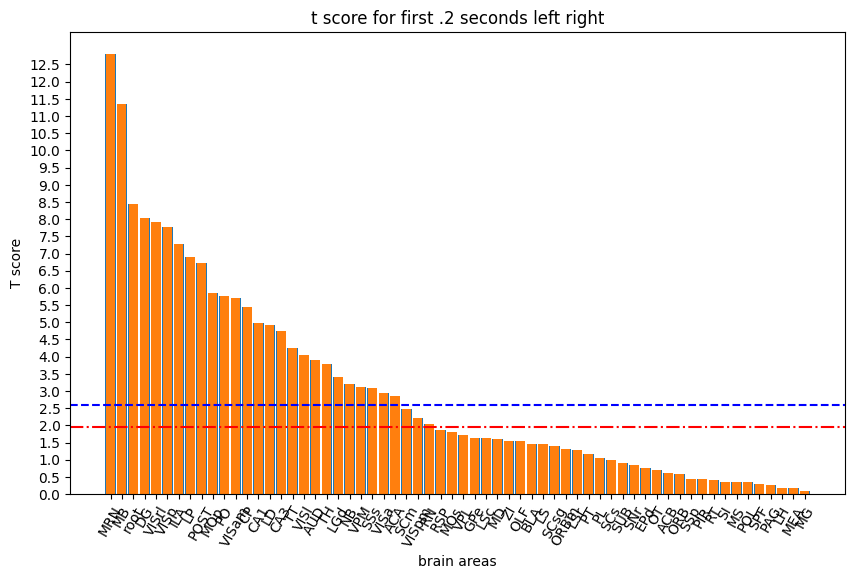

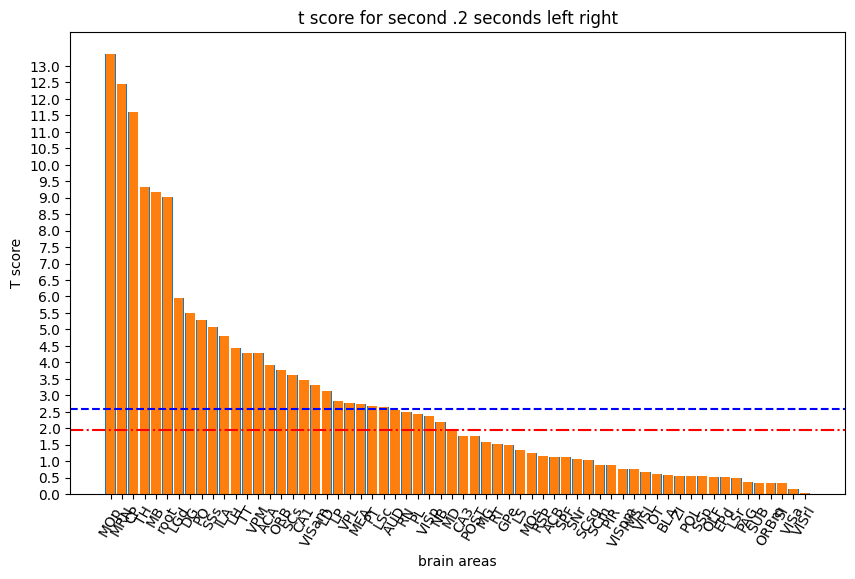

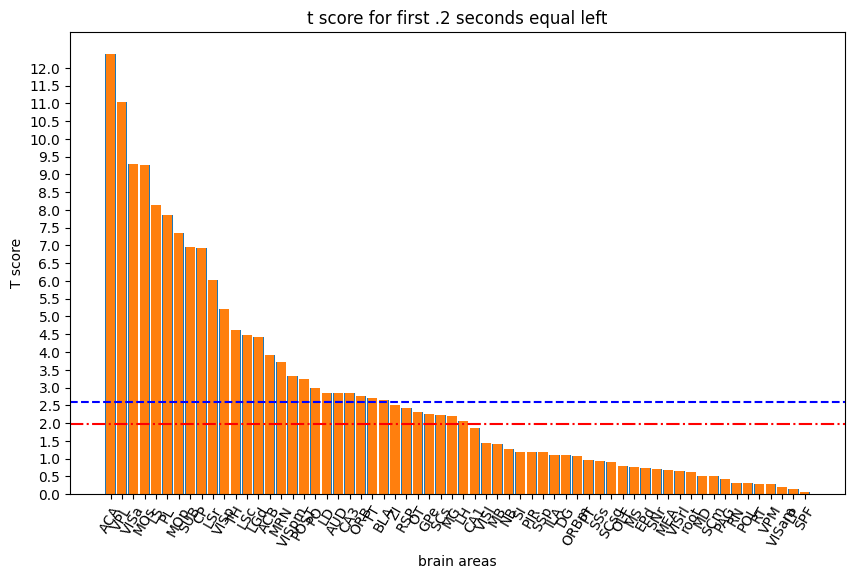

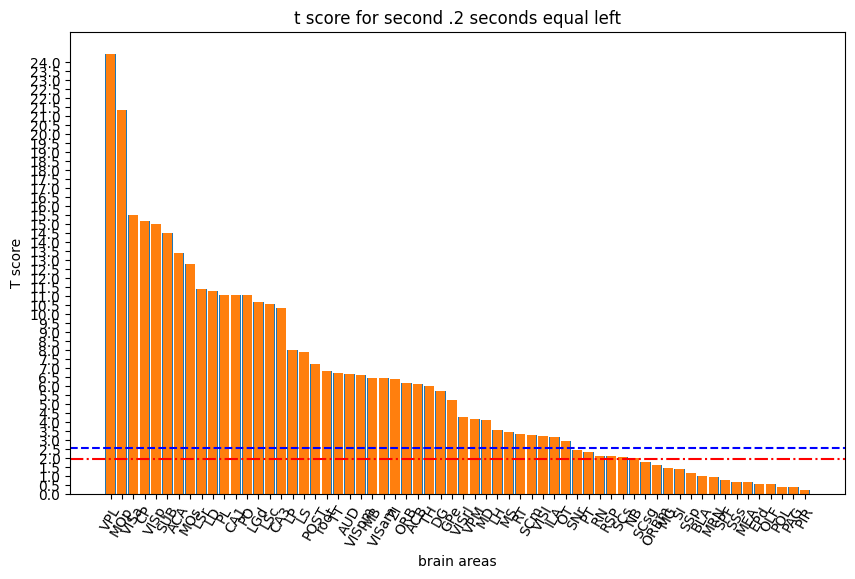

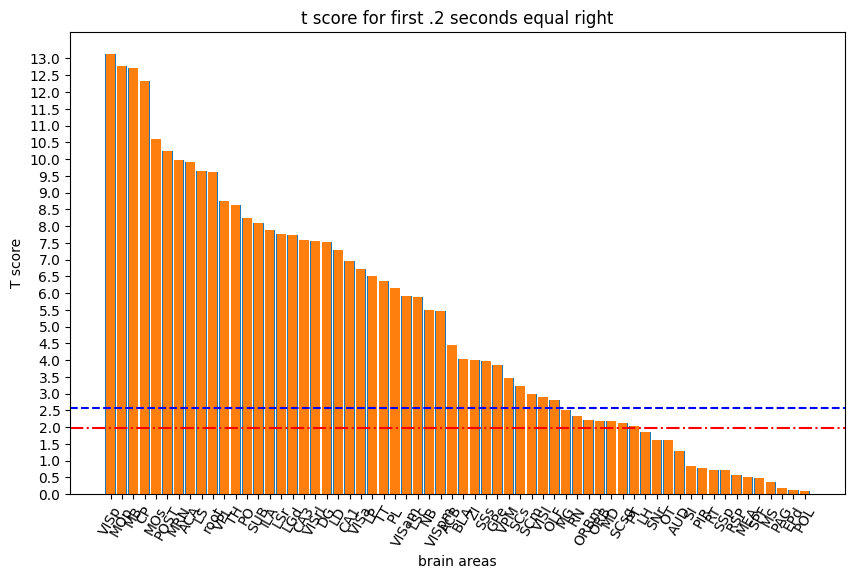

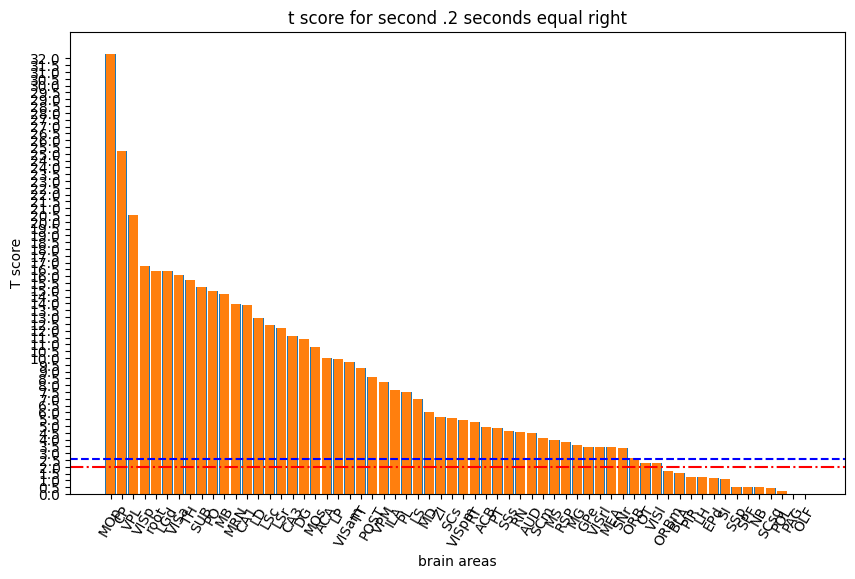

In [39]:
import math
namesfirstLR = []
firstLR = []
namessecondLR = []
secondLR = []

namesfirstEL = []
firstEL = []
namessecondEL = []
secondEL = []

namesfirstER = []
firstER = []
namessecondER = []
secondER = []

allnames = []

for key in brain_area_objects:
  allnames.append(key)
  if brain_area_objects[key].first_t_statLR is not None and not (math.isnan(brain_area_objects[key].first_t_statLR)):
    firstLR.append(brain_area_objects[key].first_t_statLR)
    namesfirstLR.append(key)

  if brain_area_objects[key].second_t_statLR is not None and not (math.isnan(brain_area_objects[key].second_t_statLR)):
    secondLR.append(brain_area_objects[key].second_t_statLR)
    namessecondLR.append(key)

  if brain_area_objects[key].first_t_statEL is not None and not (math.isnan(brain_area_objects[key].first_t_statEL)):
    firstEL.append(brain_area_objects[key].first_t_statEL)
    namesfirstEL.append(key)

  if brain_area_objects[key].second_t_statEL is not None and not (math.isnan(brain_area_objects[key].second_t_statEL)):
    secondEL.append(brain_area_objects[key].second_t_statEL)
    namessecondEL.append(key)

  if brain_area_objects[key].first_t_statER is not None and not (math.isnan(brain_area_objects[key].first_t_statER)):
    firstER.append(brain_area_objects[key].first_t_statER)
    namesfirstER.append(key)

  if brain_area_objects[key].second_t_statER is not None and not (math.isnan(brain_area_objects[key].second_t_statER)):
    secondER.append(brain_area_objects[key].second_t_statER)
    namessecondER.append(key)


def get_bar_graph(data, labels, title, cut):

    my_dict = {label: datum for label, datum in zip(labels, data)}
    sorted_dict = dict(sorted(my_dict.items(), key=lambda item: item[1], reverse=True))
    new_labels = []
    new_data = []
    for key in sorted_dict:
      new_labels.append(key)
      new_data.append(sorted_dict[key])
    plt.figure(figsize=(10, 6))
    plt.bar(new_labels, new_data, width=.9)
    plt.bar(new_labels, new_data)
    plt.xticks(rotation=60, ha='center')
    plt.xlabel('brain areas')
    plt.ylabel('T score')
    plt.title(title)
    plt.yticks([i/2 for i in range(int(max(new_data)*2) + 1)])
    plt.axhline(y=1.96, color='red', linestyle='-.') # show significant line
    plt.axhline(y=cut, color='blue', linestyle='--')
    plt.show()
    # getting the t scores above the cut off
    sig = []
    for datum in range(len(data)):
      if data[datum] > cut:
        sig.append(labels[datum])
    return sig




sig_firstLR = get_bar_graph(firstLR, namesfirstLR, 't score for first .2 seconds left right', 2.58 ) # where I notice a cut off



sig_secondLR = get_bar_graph(secondLR, namessecondLR, 't score for second .2 seconds left right', 2.58 )


sig_firstEL = get_bar_graph(firstEL, namesfirstEL, 't score for first .2 seconds equal left', 2.58 ) # where I notice a cut off


sig_secondEL = get_bar_graph(secondEL, namessecondEL, 't score for second .2 seconds equal left', 2.58 )

sig_firstER = get_bar_graph(firstER, namesfirstER, 't score for first .2 seconds equal right', 2.58 ) # where I notice a cut off


sig_secondER = get_bar_graph(secondER, namessecondER, 't score for second .2 seconds equal right', 2.58 )


In [40]:
#significant brain areas for each half of the time interval

print(sig_firstEL)
print(sig_secondEL)

print(sig_firstER)
print(sig_secondER)

print(sig_firstLR)
print(sig_secondLR)

['VISp', 'LS', 'VPL', 'LSr', 'VISa', 'LD', 'TH', 'AUD', 'CA3', 'PL', 'POST', 'BLA', 'CP', 'SUB', 'PO', 'MRN', 'VISpm', 'MOp', 'LSc', 'ACB', 'MOs', 'TT', 'ORB', 'ACA', 'LGd']
['VISp', 'LS', 'VPL', 'GPe', 'root', 'LSr', 'ZI', 'VISa', 'LD', 'VPM', 'ILA', 'TH', 'SCm', 'VISrl', 'AUD', 'MD', 'CA3', 'VISl', 'PL', 'RT', 'POST', 'CP', 'SUB', 'PO', 'OT', 'MS', 'LH', 'VISpm', 'CA1', 'VISam', 'MOp', 'LSc', 'DG', 'LP', 'ACB', 'MB', 'MOs', 'TT', 'ORB', 'ACA', 'LGd']
['VISp', 'LS', 'SSs', 'VPL', 'GPe', 'root', 'SCs', 'LSr', 'ZI', 'VISa', 'LD', 'VPM', 'ILA', 'TH', 'SCm', 'VISrl', 'CA3', 'VISl', 'PL', 'POST', 'BLA', 'OLF', 'CP', 'SUB', 'PO', 'MRN', 'VISpm', 'CA1', 'VISam', 'MOp', 'LSc', 'DG', 'LP', 'ACB', 'MB', 'MOs', 'TT', 'NB', 'ACA', 'LGd']
['VISp', 'RN', 'LS', 'SSs', 'VPL', 'GPe', 'root', 'SCs', 'LSr', 'ZI', 'MG', 'VISa', 'LD', 'VPM', 'ILA', 'TH', 'SCm', 'VISrl', 'AUD', 'MD', 'PT', 'CA3', 'PL', 'RT', 'POST', 'CP', 'SUB', 'PO', 'MRN', 'MS', 'VISpm', 'CA1', 'VISam', 'MEA', 'MOp', 'LSc', 'SNr', 'DG', 

In [41]:
# we will take the union of these to reflect the fact that we want to consider brain areas that are significant in either part of the time interval

sig_firstEL = set(sig_firstEL)
sig_secondEL = set(sig_secondEL)
sig_firstER = set(sig_firstER)
sig_secondER = set(sig_secondER)
sig_firstLR = set(sig_firstLR)
sig_secondLR = set(sig_secondLR)


sig_union = list(sig_firstEL | sig_secondEL | sig_firstER | sig_secondER | sig_firstLR | sig_secondLR)

In [42]:
sig_union

['VISp',
 'LS',
 'SSs',
 'GPe',
 'MG',
 'VISa',
 'VPM',
 'ILA',
 'VISrl',
 'MD',
 'RT',
 'BLA',
 'CP',
 'OLF',
 'PO',
 'LH',
 'VISpm',
 'CA1',
 'VISam',
 'MOp',
 'LSc',
 'SNr',
 'DG',
 'ACB',
 'MB',
 'ORB',
 'NB',
 'RN',
 'VPL',
 'root',
 'SCs',
 'LSr',
 'ZI',
 'LD',
 'TH',
 'SCm',
 'AUD',
 'PT',
 'CA3',
 'PL',
 'VISl',
 'POST',
 'SUB',
 'OT',
 'MRN',
 'MS',
 'MEA',
 'LP',
 'MOs',
 'TT',
 'RSP',
 'ACA',
 'LGd']

In [43]:
difference = [x for x in allnames if x not in sig_union]
print(difference)
# these are all the ones we deleted
print(len(difference))

['SSp', 'EPd', 'POL', 'ORBm', 'SPF', 'SCsg', 'PAG', 'PIR', 'SI']
9


In [44]:
# we are going to delete the connectors for all neurons associated with brain areas not listed here

unsignificant = [x for x in allnames if x not in sig_union]




In [45]:
unsignificant

['SSp', 'EPd', 'POL', 'ORBm', 'SPF', 'SCsg', 'PAG', 'PIR', 'SI']

# NOTE TO SELF ^^ DO NOT RUN TWICE

Note: I accidently ran it twice anf thats why theres an error

We are gonna need a new class just called sig neurons to reflect the class that we don't need all the trial and session information anymore

In [47]:
# the goal is to end up with a list of neurons with all the data across trials for each section

class Grouped_neuron():
  # where as are neuron instant class represented neuron each neurons behavior in a specific trial as a seperate instance, this class groups neurons across trials
  def __init__(self, left_true, right_true, left_false, right_false, equal_true, source_session, brain_area, neurons):
    self.left_true = left_true
    self.avg_left = None
    self.right_true = right_true
    self.avg_right = None
    self.left_false = left_false
    self.neurons = neurons # this is important because later we will need a way to seperate these by trials
    # these are the neuron instances which contain info about the trials they came from
    self.right_false = right_false
    self.equal_true = equal_true
    self.avg_equal = None
    self.left_right_equal = None
    self.session_num = source_session
    if brain_area in unsignificant:
      raise ValueError(brain_area)
    else:
      self.brain_area = brain_area
    self.cluster = None
  def set_cluster(self, cluster):
    self.cluster = cluster
    for neuron in self.neurons:
      neuron.cluster = self.cluster

  def get_avgs(self):
    avg_left= [sum(values) / len(values) for values in zip(*self.left_true)] #will return one list of element wise averages
    if len(avg_left) != 40:
      raise ValueError("something unexpected occured! lenght avg left = " + str(len(avg_left)))

    avg_right= [sum(values) / len(values) for values in zip(*self.right_true)]
    if len(avg_right) != 40:
      raise ValueError("something unexpected occured! lenght avg_right = " + str(len(avg_right)))
    avg_equal = [sum(values) / len(values) for values in zip(*self.equal_true)]
    if len(avg_equal) != 40:
      raise ValueError("something unexpected occured! lenght avg_right = " + str(len(avg_equal)))
    self.left_right_equal = avg_left + avg_right + avg_equal # this is what we will use for clustering




[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [48]:


print(len(sessions))

#contrasts = ["left true", "right true", "equal true"]
unsig_counter = 0 # to see how many unsignificant brain areas we are deleting
neurons_dictionarys = []
for session in sessions:
  print("  \n new sesh:", session.name, "\n\n")
  non_none = [neuron for neuron in session.trials[0].neurons if neuron is not None]
  # we will not be filling none rows with data, so we don't need to include them
  temp_dict = {key: [] for key in range(0, len(non_none))} # this is where we are going to store the data for each neuron
  print(temp_dict)
  # I choose trials[0] arrbitrarily since each trial should have the same number of neurons
  for trial in session.trials:
    trial_index = 0 # so that we have neuron objects at the same index in that trial for that session grouped together
    for neuron in trial.neurons:
      if neuron is None:
        continue # this corresponds to old code where I deleted all the neurons with unsignificant brain areas
      elif neuron is not None:
        if neuron.brain_area in unsignificant:
          unsig_counter += 1
          continue # we want to ignore neurons with unsignificant brain areas
        else:
          if neuron.brain_area == 'ORBm':
            print("ahh wtf")
            print(neuron.brain_area in unsignificant)
        # note: if the neuron is none or has unsignificant brain area, that will be the case across every single trial for that neuron
        # thus we will put the next neuron at this same index to fill the gap
          temp_dict[trial_index].append(neuron)
          trial_index+=1
        # there will be empty keys at the end

  neurons_dictionarys.append(temp_dict) # this will be ordered by session



  print(len(temp_dict))
  print(session.matrix.shape[1])


print(len(neurons_dictionarys))

print(unsig_counter)


20
  
 new sesh: sesh1 


{0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 25: [], 26: [], 27: [], 28: [], 29: [], 30: [], 31: [], 32: [], 33: [], 34: [], 35: [], 36: [], 37: [], 38: [], 39: [], 40: [], 41: [], 42: [], 43: [], 44: [], 45: [], 46: [], 47: [], 48: [], 49: [], 50: [], 51: [], 52: [], 53: [], 54: [], 55: [], 56: [], 57: [], 58: [], 59: [], 60: [], 61: [], 62: [], 63: [], 64: [], 65: [], 66: [], 67: [], 68: [], 69: [], 70: [], 71: [], 72: [], 73: [], 74: [], 75: [], 76: [], 77: [], 78: [], 79: [], 80: [], 81: [], 82: [], 83: [], 84: [], 85: [], 86: [], 87: [], 88: [], 89: [], 90: [], 91: [], 92: [], 93: [], 94: [], 95: [], 96: [], 97: [], 98: [], 99: [], 100: [], 101: [], 102: [], 103: [], 104: [], 105: [], 106: [], 107: [], 108: [], 109: [], 110: [], 111: [], 112: [], 113: [], 114: [], 115: [], 116: [], 117: [], 118: [], 119: [], 120

In [108]:
print(unsignificant)

['ORBm', 'SSp', 'PAG', 'SI', 'POL', 'EPd', 'PIR', 'SPF', 'SCsg']


In [49]:
grouped_neurons = []
session_counter  = 0
problem_counter = 0
for dictionary in neurons_dictionarys: # will be in order of sessions
  #print(len(dictionary)) # should be 18
  session_counter += 1
  for key in dictionary: # where key corresponds to the neurons index and the values will be a list of the neuron object for all trials in this session
    if len(dictionary[key]) < 1:
      continue # these correspond to neurons that we didnt include because they were none or unsignificant brain areas
    else:

      left_true = []
      right_true = []
      left_false = []
      right_false = []
      equal_true = []
      neuron_list = []

      for neuron in dictionary[key]:

        if neuron.brain_area in unsignificant:
          raise ValueError(neuron.brain_area)
        else:
          neuron_list.append(neuron) # this is super important cause it ensures will still have access to the trial data which this contains
          if neuron.kind == 'left true': # get the conditions of the trial for each neuron
                    left_true.append(neuron.data)
          elif neuron.kind == 'right true':
                    right_true.append(neuron.data)
          elif neuron.kind == 'left false':
                    left_false.append(neuron.data)
          elif neuron.kind == 'right false':
                    right_false.append(neuron.data)
          elif neuron.kind == 'equal true':
                    equal_true.append(neuron.data)

      grouped_neurons.append(Grouped_neuron(left_true, right_true, left_false, right_false, equal_true, session_counter, neuron_list[0].brain_area, neuron_list))

In [50]:
print(len(grouped_neurons[0].left_true)) #will give us a list of all the brain activity in the left true conditions
# we are seing how long this list is. should correspond to the number of trials in that session for which that condition was met
print(len(grouped_neurons[0].left_true[0])) #will give us 40 hopefully ( the neuron activation over 40 time stamps)

print(grouped_neurons[0].session_num) #will give us the session it came from
print(grouped_neurons[0].brain_area) # will give us brain area

print(len(grouped_neurons[len(grouped_neurons) - 3].left_true)) #will give us a list of all the brain activity in the left true conditions
# we are seing how long this list is. should correspond to the number of trials in that session for which that condition was met
print(len(grouped_neurons[len(grouped_neurons) - 3].left_true[0])) #will give us 40 hopefully ( the neuron activation over 40 time stamps)
print(grouped_neurons[len(grouped_neurons) - 3].session_num) #will give us the session it came from
print(grouped_neurons[len(grouped_neurons) - 3].brain_area) # will give us brain area

print(grouped_neurons[len(grouped_neurons) - 3].neurons[0].mother.trial_id)
print(grouped_neurons[len(grouped_neurons) - 3].neurons[50].mother.trial_id)

# we want to find the averages because right now the first session and 18th session have different dimesions for each of their lists

24
40
1
ACA
28
40
20
root
seshtest2_0
seshtest2_50


In [51]:
# getting averages
for grouped_neuron in grouped_neurons:
  grouped_neuron.get_avgs() # see the significant neurons class. We are finding the element wise averages

In [112]:
print(len(grouped_neurons[0].left_right_equal)-40*3) # nice!

0


In [52]:
brain_areas_in_grouped = [neuron.brain_area for neuron in grouped_neurons]
intersection = set(brain_areas_in_grouped).intersection(set(unsignificant))

In [53]:
print(intersection) # this should be empty set

set()


In [ ]:
from sklearn.cluster import KMeans
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from scipy.stats import norm

flattened_data = [neuron.left_right_equal for neuron in grouped_neurons]


X = np.array(flattened_data)

num_clusters = 3

kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)

cluster_labels_3 = kmeans.labels_


cluster_means = []
cluster_sds = []

for i in range(num_clusters):
    cluster_data = X[cluster_labels_3 == i]  # data points belonging to cluster i
    mean = np.mean(cluster_data)
    sd = np.std(cluster_data)
    cluster_means.append(mean)
    cluster_sds.append(sd)

tsne = TSNE(n_components=2, random_state=12)
X_embedded = tsne.fit_transform(X)

plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    plt.scatter(X_embedded[cluster_labels_3 == i, 0], X_embedded[cluster_labels_3 == i, 1], label=f'Cluster {i}')



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/numpy/core/multiarray.py", line 346, in where
    @array_function_from_c_func_and_dispatcher(_multiarray_umath.where)
KeyboardInterrupt: 


## I realised I already concluded that clustering with 2 is better than clustering with 3. Thus I stopped running it to conserve time. Hence the "KeyboardInterrupt" error

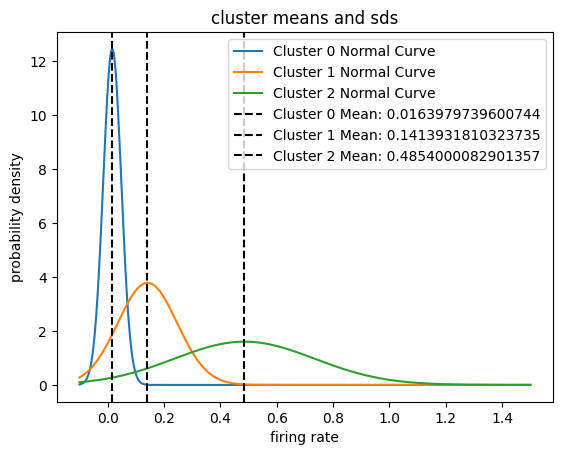

In [ ]:

x_values = np.linspace(np.min(X)-.1, 1.5, 1000)
for i in range(num_clusters):
    plt.plot(x_values, norm.pdf(x_values, cluster_means[i], cluster_sds[i]), label=f'Cluster {i} Normal Curve')
for i in range(num_clusters):
  label_string = f'Cluster {i} Mean: ' + str(cluster_means[i])
  plt.axvline(x=cluster_means[i], color='black', linestyle='--', label=label_string)
plt.title('cluster means and sds')
plt.xlabel('firing rate')
plt.ylabel('probability density')
plt.legend()
plt.show()



To see the population density

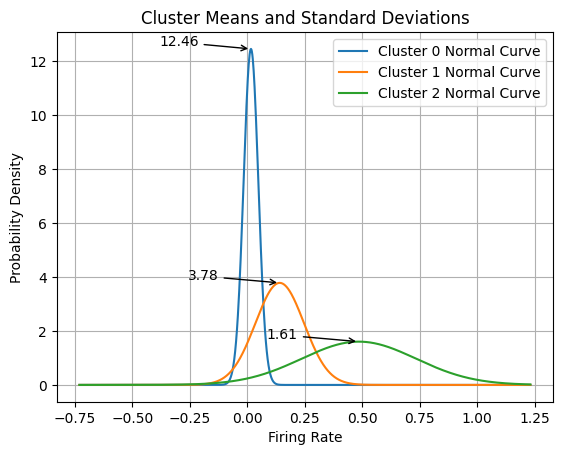

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm



x_values = np.linspace(np.min(cluster_means) - 3 * np.max(cluster_sds),
                       np.max(cluster_means) + 3 * np.max(cluster_sds), 1000)


for i in range(num_clusters):
    plt.plot(x_values, norm.pdf(x_values, cluster_means[i], cluster_sds[i]),
             label=f'Cluster {i} Normal Curve')


    peak_value = np.max(norm.pdf(x_values, cluster_means[i], cluster_sds[i]))
    peak_index = np.argmax(norm.pdf(x_values, cluster_means[i], cluster_sds[i]))
    peak_x = x_values[peak_index]


    plt.annotate(f'{peak_value:.2f}', xy=(peak_x, peak_value),
                 xytext=(peak_x - 0.4, peak_value + 0.1),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.title('Cluster Means and Standard Deviations')
plt.xlabel('Firing Rate')
plt.ylabel('Probability Density')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
print(len(grouped_neurons))
print(len(cluster_labels_3))
ones = 0
twos = 0
zeros = 0
for num in cluster_labels_3:
  if num == 1:
    ones+=1
  if num == 2:
    twos += 1
  if num == 0:
    zeros += 1
print(ones, twos, zeros)

14983
14983
1637 166 13180


one group only has a 166 neurons. This is very small so I will try with 2 clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


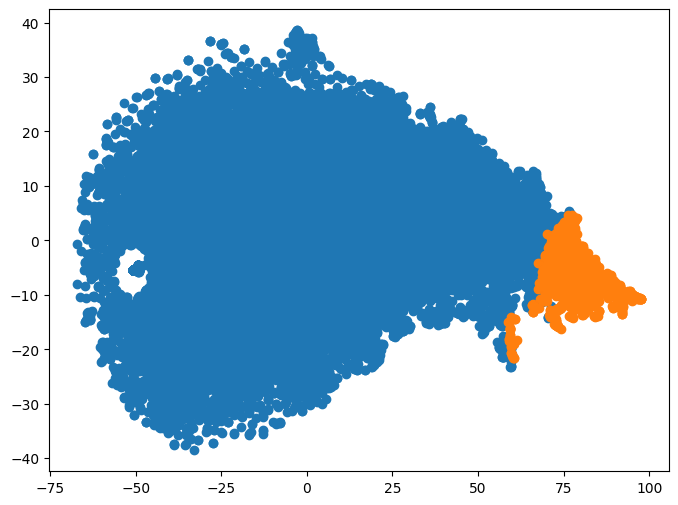

In [54]:
from sklearn.cluster import KMeans
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from scipy.stats import norm

flattened_data = [neuron.left_right_equal for neuron in grouped_neurons]


X = np.array(flattened_data)

num_clusters = 2 # Ill try with 2

kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)

cluster_labels_2 = kmeans.labels_


cluster_means_2 = []
cluster_sds_2 = []

for i in range(num_clusters):
    cluster_data = X[cluster_labels_2 == i]
    mean = np.mean(cluster_data)
    sd = np.std(cluster_data)
    cluster_means_2.append(mean)
    cluster_sds_2.append(sd)


tsne = TSNE(n_components=2, random_state=182)
X_embedded = tsne.fit_transform(X)

plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    plt.scatter(X_embedded[cluster_labels_2 == i, 0], X_embedded[cluster_labels_2 == i, 1], label=f'Cluster {i}')

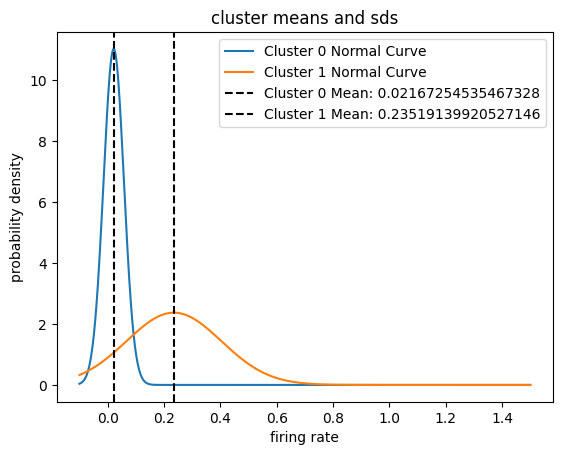

In [55]:
x_values = np.linspace(np.min(X)-.1, 1.5, 1000)
for i in range(num_clusters):
    plt.plot(x_values, norm.pdf(x_values, cluster_means_2[i], cluster_sds_2[i]), label=f'Cluster {i} Normal Curve')
for i in range(num_clusters):
  label_string = f'Cluster {i} Mean: ' + str(cluster_means_2[i])
  plt.axvline(x=cluster_means_2[i], color='black', linestyle='--', label=label_string)
plt.title('cluster means and sds')
plt.xlabel('firing rate')
plt.ylabel('probability density')
plt.legend()
plt.show()

In [56]:
zero = 0
one = 0


for cluster in cluster_labels_2:
    if cluster == 0:
        zero += 1
    elif cluster == 1:
        one += 1


print("Cluster Counts:")
print(f"Cluster 0: {zero}")
print(f"Cluster 1: {one}")
print(zero+one)
print(len(grouped_neurons))


Cluster Counts:
Cluster 0: 16522
Cluster 1: 994
17516
17516


I will use just 2 clusters due to small size

In [57]:
# now we need to figure out how we want to organize our training and testing data

for i in range(len(grouped_neurons)):
  if cluster_labels_2[i] == 1:
    print(i)
  grouped_neurons[i].set_cluster(cluster_labels_2[i])
  # we are using this function rather than just changing the value directly because this function will also change the cluster for all the neuron instances

199
249
274
275
276
277
278
279
282
284
288
290
298
302
304
362
372
377
400
421
435
436
437
470
484
489
505
509
530
540
546
547
617
632
650
651
652
653
654
655
656
657
659
660
661
667
669
675
676
678
683
685
693
695
710
728
751
753
780
794
808
829
858
867
885
906
914
931
947
973
1017
1053
1071
1107
1108
1190
1264
1266
1304
1306
1311
1312
1337
1341
1349
1401
1412
1438
1455
1467
1490
1492
1493
1522
1564
1585
1589
1600
1620
1630
1697
1712
1719
1728
1734
1779
1783
1785
1810
1814
1832
1847
1882
1897
1939
1943
1946
1990
1993
2003
2004
2014
2015
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2033
2042
2043
2044
2054
2074
2083
2084
2085
2086
2091
2096
2097
2098
2103
2104
2105
2110
2116
2117
2120
2121
2124
2128
2130
2134
2135
2161
2167
2246
2330
2331
2332
2333
2335
2336
2337
2338
2339
2340
2341
2344
2347
2357
2359
2363
2374
2387
2389
2390
2392
2393
2403
2423
2531
2575
2652
2702
2706
2962
2963
2964
2985
3320
3321
3322
3324
3325
3327
3328
3329
3331
3334
3337
3346
3432
3628
3686
3714
3819


In [58]:
len(grouped_neurons)

17516

In [59]:
for grouped_neuron in grouped_neurons:
  for neuron in grouped_neuron.neurons:
    if neuron.cluster != 0:
      print(neuron.mother.trial_id)
      if neuron.brain_area in unsignificant: #one last check
        print("ERROR ERROR", neuron.brain_area)
  # success! looks like there is one in every trial and session like I wanted

Streaming output truncated to the last 5000 lines.
seshtest1_0
seshtest1_1
seshtest1_2
seshtest1_3
seshtest1_4
seshtest1_5
seshtest1_6
seshtest1_7
seshtest1_8
seshtest1_9
seshtest1_10
seshtest1_11
seshtest1_12
seshtest1_13
seshtest1_14
seshtest1_15
seshtest1_16
seshtest1_17
seshtest1_18
seshtest1_19
seshtest1_20
seshtest1_21
seshtest1_22
seshtest1_23
seshtest1_24
seshtest1_25
seshtest1_26
seshtest1_27
seshtest1_28
seshtest1_29
seshtest1_30
seshtest1_31
seshtest1_32
seshtest1_33
seshtest1_34
seshtest1_35
seshtest1_36
seshtest1_37
seshtest1_38
seshtest1_39
seshtest1_40
seshtest1_41
seshtest1_42
seshtest1_43
seshtest1_44
seshtest1_45
seshtest1_46
seshtest1_47
seshtest1_48
seshtest1_49
seshtest1_50
seshtest1_51
seshtest1_52
seshtest1_53
seshtest1_54
seshtest1_55
seshtest1_56
seshtest1_57
seshtest1_58
seshtest1_59
seshtest1_60
seshtest1_61
seshtest1_62
seshtest1_63
seshtest1_64
seshtest1_65
seshtest1_66
seshtest1_67
seshtest1_68
seshtest1_69
seshtest1_70
seshtest1_71
seshtest1_72
seshtest1_

In [60]:
names_total = [] # I want to get all the trial id names. I will take a set of these later to get rid of all the dups
for grouped_neuron in grouped_neurons:
  for neuron in grouped_neuron.neurons:
    names_total.append(neuron.mother.trial_id)
unique_names = list(set(names_total))

print(unique_names)
print(len(unique_names)) # this will be how many rows we have in the dataframe. Not many, but enough. Training will be fast

['sesh6_41', 'sesh1_6', 'sesh2_180', 'seshtest2_34', 'sesh6_142', 'sesh4_147', 'sesh6_128', 'sesh16_121', 'sesh13_54', 'sesh14_29', 'sesh4_119', 'sesh2_54', 'sesh15_334', 'sesh9_332', 'sesh18_51', 'sesh12_160', 'sesh8_111', 'sesh2_187', 'sesh10_3', 'sesh12_215', 'sesh13_269', 'sesh1_39', 'sesh16_147', 'sesh7_92', 'sesh10_405', 'sesh8_18', 'sesh15_354', 'sesh16_111', 'sesh15_235', 'sesh9_208', 'sesh7_106', 'sesh4_200', 'seshtest1_25', 'sesh13_25', 'sesh12_20', 'sesh6_86', 'seshtest2_31', 'sesh11_121', 'sesh10_366', 'sesh16_49', 'sesh2_155', 'sesh4_245', 'sesh3_81', 'sesh10_270', 'sesh12_50', 'sesh15_62', 'sesh9_174', 'sesh10_418', 'sesh9_92', 'sesh18_120', 'sesh10_172', 'sesh12_329', 'sesh2_55', 'sesh10_67', 'sesh1_20', 'sesh4_158', 'sesh2_85', 'sesh13_101', 'sesh1_16', 'sesh14_48', 'sesh18_9', 'sesh7_63', 'sesh7_178', 'sesh1_89', 'sesh6_288', 'sesh9_57', 'sesh16_14', 'sesh10_174', 'sesh9_45', 'sesh8_103', 'sesh7_105', 'sesh1_90', 'sesh2_176', 'sesh14_108', 'sesh9_358', 'sesh4_191', 'se

In [82]:
# yet another class. I can't help myself XD
class trial_row_class():
  def __init__(self):
  #stuff that will actually be used in df
    self.name = None
    self.cluster0_avg_half1 = None # the average firing of the cluster 0 neurons in the first half of the time interval
    self.cluster1_avg_half1 = None # the average firing of the cluster 1 neurons in the first half of the time interval

    self.cluster0_avg_half2 = None # the average firing of the cluster 0 neurons in the second half of the time interval
    self.cluster1_avg_half2 = None # the average firing of the cluster 1 neurons in the second half of the time interval

    self.right = None # one hot encoding the results. this will be 1 or 0
    self.left = None
    self.equal = None
    self.feedback = None

    self.test = False
  # stuff that will help us construct the df
    self.cluster0_neurons = [] # the actual neurons
    self.cluster1_neurons = []


  # this is a private helper function that is only accessiable within the class
  def __get_averages(self, cluster_neurons):
        temp_first = []
        temp_second = []
        for neuron in cluster_neurons:
            if len(neuron.data) != 40:
                raise ValueError("something unexpected occured! Neuron.data length should be 40. Instead its " + str(len(neuron.data)))
            else:
                temp_first.append(np.mean(neuron.data[:20]))
                temp_second.append(np.mean(neuron.data[20:]))

        if not (len(temp_first) == len(cluster_neurons) and len(temp_second) == len(cluster_neurons)):
            raise ValueError("we must have calculated the means wrong cause the lists are not equal: " + str(len(cluster_neurons)) + " " + str(len(temp_first))+ " " + str(len(temp_second)))
        else:
            return np.mean(temp_first), np.mean(temp_second)


  def __check_result(self): # to check our result to make sure the neurons all have the same result
    total_neurons = self.cluster0_neurons + self.cluster1_neurons
    kinds = [neuron.kind for neuron in total_neurons]
    if len(list(set(kinds))) != 1: #they should all be the same element
      raise ValueError("Not all neurons are of the same kind" + str(kinds))
    else:
      return True
    # to averages once we have neuron data

  def __handle_false(self): # used to handle test data which may be false
    if self.cluster0_neurons[0].kind == "left false":
        self.left = 1
        self.right = 0
        self.equal = 0
        self.feedback = 0 # reset feedback to 0
    elif self.cluster0_neurons[0].kind == "right false":
        self.left = 0
        self.right = 1
        self.equal = 0
        self.feedback = 0 # reset feedback to 0 (shoud already be 0. this i more of a safety measure )
    else:
      raise ValueError(self.cluster0_neurons[0].kind)

  def make_test(self):
    self.test = True

  def set_averages(self):
     self.cluster0_avg_half1, self.cluster0_avg_half2 =  self.__get_averages(self.cluster0_neurons)
     self.cluster1_avg_half1, self.cluster1_avg_half2 =  self.__get_averages(self.cluster1_neurons)

  def set_result(self):
    if self.__check_result():
      if self.cluster0_neurons[0].kind == "left true":
        self.left = 1
        self.right = 0
        self.equal = 0
      elif self.cluster0_neurons[0].kind == "right true":
        self.left = 0
        self.right = 1
        self.equal = 0
      elif self.cluster0_neurons[0].kind == "equal true":
        self.left = 0
        self.right = 0
        self.equal = 1
      else:
        self.__handle_false()


  def set_feedback(self, feedback):
    if feedback < 0:
      self.feedback = 0 #zero for wrong, one for right
    else:
      self.feedback = feedback





In [83]:
trial_rows = {}
for name in unique_names:
  temp = trial_row_class()
  temp.name = name
  trial_rows[name] = temp


In [84]:
trial_rows

{'sesh6_41': <__main__.trial_row_class at 0x7e853daac250>,
 'sesh1_6': <__main__.trial_row_class at 0x7e853daafa90>,
 'sesh2_180': <__main__.trial_row_class at 0x7e853da690c0>,
 'seshtest2_34': <__main__.trial_row_class at 0x7e853da690f0>,
 'sesh6_142': <__main__.trial_row_class at 0x7e853da6b370>,
 'sesh4_147': <__main__.trial_row_class at 0x7e853da69a50>,
 'sesh6_128': <__main__.trial_row_class at 0x7e853da6b250>,
 'sesh16_121': <__main__.trial_row_class at 0x7e853da21bd0>,
 'sesh13_54': <__main__.trial_row_class at 0x7e853da218a0>,
 'sesh14_29': <__main__.trial_row_class at 0x7e853d7b1480>,
 'sesh4_119': <__main__.trial_row_class at 0x7e853d7b0a60>,
 'sesh2_54': <__main__.trial_row_class at 0x7e853d7b0d60>,
 'sesh15_334': <__main__.trial_row_class at 0x7e853d7b0bb0>,
 'sesh9_332': <__main__.trial_row_class at 0x7e853d7b0790>,
 'sesh18_51': <__main__.trial_row_class at 0x7e853d7b0520>,
 'sesh12_160': <__main__.trial_row_class at 0x7e853d7b1f90>,
 'sesh8_111': <__main__.trial_row_clas

In [75]:
string = "right true"
string[-4:]

'true'

In [85]:
for grouped_neuron in grouped_neurons:
  for neuron in grouped_neuron.neurons:
    if 'test' in neuron.mother.mother.name:
      print(neuron.mother.mother.name)
      trial_rows[neuron.mother.trial_id].make_test() # mark it as test data
      if neuron.cluster == 0:
            trial_rows[neuron.mother.trial_id].cluster0_neurons.append(neuron) # we know this neuron belongs to this row
            trial_rows[neuron.mother.trial_id].set_feedback(neuron.mother.feedback)
      elif neuron.cluster == 1:
            trial_rows[neuron.mother.trial_id].cluster1_neurons.append(neuron)


    elif neuron.kind[-4:] != 'true': # this will not contain any data we want
          try:
            del trial_rows[neuron.mother.trial_id]
          except: # means we already deleted it
            continue
    else:
          if neuron.cluster == 0:
            trial_rows[neuron.mother.trial_id].cluster0_neurons.append(neuron) # we know this neuron belongs to this row
          elif neuron.cluster == 1:
            trial_rows[neuron.mother.trial_id].cluster1_neurons.append(neuron)




Streaming output truncated to the last 5000 lines.
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2
seshtest2

In [86]:
print(len(trial_rows))

4434


In [87]:
for key in trial_rows:

  if len(trial_rows[key].cluster0_neurons) == 0 or len(trial_rows[key].cluster1_neurons) == 0 :
    print("ladies and gentlemen, we have a 0")
# nice!

In [88]:
for key in trial_rows:
  trial_rows[key].set_averages()
  trial_rows[key].set_result()

In [89]:
print(trial_rows['sesh10_11'].right, trial_rows['sesh10_11'].left, trial_rows['sesh10_11'].equal, trial_rows['sesh10_11'].cluster0_avg_half1, trial_rows['sesh10_11'].cluster0_avg_half2, trial_rows['sesh10_11'].cluster1_avg_half1, trial_rows['sesh10_11'].cluster1_avg_half2)


0 0 1 0.019464847848898213 0.02098635886673662 0.2684782608695652 0.2760869565217391


In [ ]:
# NICE

In [100]:
TRAINcluster0_half1 = []
TRAINcluster0_half2 = []
TRAINcluster1_half1 = []
TRAINcluster1_half2 = []
# the results are one hot encoded
TRAINleft = []
TRAINright = []
TRAINequal = []
TRAINnames = []

TESTcluster0_half1 = []
TESTcluster0_half2 = []
TESTcluster1_half1 = []
TESTcluster1_half2 = []
# the results are one hot encoded
TESTleft = []
TESTright = []
TESTequal = []
TESTnames = []
feedback = []

for trial_row_key in trial_rows:
  if trial_rows[trial_row_key].test:
    TESTcluster0_half1.append(trial_rows[trial_row_key].cluster0_avg_half1)
    TESTcluster0_half2.append(trial_rows[trial_row_key].cluster0_avg_half2)

    TESTcluster1_half1.append(trial_rows[trial_row_key].cluster1_avg_half1)
    TESTcluster1_half2.append(trial_rows[trial_row_key].cluster1_avg_half2)

    TESTleft.append(trial_rows[trial_row_key].left)
    TESTright.append(trial_rows[trial_row_key].right)
    TESTequal.append(trial_rows[trial_row_key].equal)
    feedback.append(trial_rows[trial_row_key].feedback)
    TESTnames.append(trial_row_key)
  else:
    TRAINcluster0_half1.append(trial_rows[trial_row_key].cluster0_avg_half1)
    TRAINcluster0_half2.append(trial_rows[trial_row_key].cluster0_avg_half2)

    TRAINcluster1_half1.append(trial_rows[trial_row_key].cluster1_avg_half1)
    TRAINcluster1_half2.append(trial_rows[trial_row_key].cluster1_avg_half2)

    TRAINleft.append(trial_rows[trial_row_key].left)
    TRAINright.append(trial_rows[trial_row_key].right)
    TRAINequal.append(trial_rows[trial_row_key].equal)

    TRAINnames.append(trial_row_key)


In [101]:
# FINALLY MAKING A DATAFRAME
train = pd.DataFrame({
    'names': TRAINnames,
    'cluster0_half1': TRAINcluster0_half1,
    'cluster0_half2': TRAINcluster0_half2,
    'cluster1_half1': TRAINcluster1_half1,
    'cluster1_half2': TRAINcluster1_half2,
    'left': TRAINleft,
    'right': TRAINright,
    'equal': TRAINequal,
})

test = pd.DataFrame({
    'names': TESTnames,
    'cluster0_half1': TESTcluster0_half1,
    'cluster0_half2': TESTcluster0_half2,
    'cluster1_half1': TESTcluster1_half1,
    'cluster1_half2': TESTcluster1_half2,
    'left': TESTleft,
    'right': TESTright,
    'equal': TESTequal,
    'feedback': feedback
})

In [103]:
train.to_csv('trainF.csv', index=False)

In [104]:
test.to_csv('testF.csv', index=False)

In [105]:
from sklearn.preprocessing import MinMaxScaler

# I scaling separately
columns_to_scale = ['cluster0_half1', 'cluster0_half2', 'cluster1_half1', 'cluster1_half2']
scaler = MinMaxScaler()
train[columns_to_scale] = scaler.fit_transform(train[columns_to_scale])
print(train)

columns_to_scale = ['cluster0_half1', 'cluster0_half2', 'cluster1_half1', 'cluster1_half2']
scaler = MinMaxScaler()
test[columns_to_scale] = scaler.fit_transform(test[columns_to_scale])
print(test)

           names  cluster0_half1  cluster0_half2  cluster1_half1  \
0        sesh1_6        0.441475        0.806934        0.383899   
1      sesh2_180        0.705461        0.549948        0.377725   
2      sesh6_142        0.111090        0.312679        0.385451   
3      sesh4_147        0.236284        0.435881        0.345510   
4     sesh16_121        0.238120        0.323459        0.225507   
...          ...             ...             ...             ...   
4229     sesh3_8        0.553589        0.464112        0.474993   
4230    sesh4_30        0.205551        0.274863        0.422289   
4231  sesh17_107        0.209108        0.259953        0.308795   
4232  sesh10_365        0.220568        0.186781        0.397253   
4233    sesh8_61        0.562094        0.381144        0.260586   

      cluster1_half2  left  right  equal  
0           0.525182     1      0      0  
1           0.302019     0      1      0  
2           0.440612     1      0      0  
3          

In [106]:
train

,names,cluster0_half1,cluster0_half2,cluster1_half1,cluster1_half2,left,right,equal
0,sesh1_6,0.441475,0.806934,0.383899,0.525182,1,0,0
1,sesh2_180,0.705461,0.549948,0.377725,0.302019,0,1,0
2,sesh6_142,0.111090,0.312679,0.385451,0.440612,1,0,0
3,sesh4_147,0.236284,0.435881,0.345510,0.488412,1,0,0
4,sesh16_121,0.238120,0.323459,0.225507,0.222823,0,0,1
...,...,...,...,...,...,...,...,...
4229,sesh3_8,0.553589,0.464112,0.474993,0.377405,0,1,0
4230,sesh4_30,0.205551,0.274863,0.422289,0.584013,1,0,0
4231,sesh17_107,0.209108,0.259953,0.308795,0.207934,0,0,1
4232,sesh10_365,0.220568,0.186781,0.397253,0.321990,0,0,1


In [107]:
test

,names,cluster0_half1,cluster0_half2,cluster1_half1,cluster1_half2,left,right,equal,feedback
0,seshtest2_34,0.459964,0.264133,0.175325,0.331325,0,1,0,1.0
1,seshtest1_25,0.352704,0.421482,0.160867,0.258809,0,0,1,0.0
2,seshtest2_31,0.229094,0.206713,0.448052,0.379518,0,0,1,1.0
3,seshtest2_77,0.046174,0.156470,0.318182,0.343373,0,0,1,1.0
4,seshtest2_23,0.255733,0.249778,0.538961,0.524096,0,0,1,1.0
...,...,...,...,...,...,...,...,...,...
195,seshtest1_42,0.379017,0.357674,0.338765,0.356331,0,1,0,0.0
196,seshtest2_67,0.031967,0.274181,0.357143,0.710843,0,1,0,1.0
197,seshtest2_12,0.252181,0.340214,0.506494,0.843373,0,1,0,1.0
198,seshtest2_47,0.452860,0.292843,0.467532,0.512048,1,0,0,1.0


In [108]:
num_rows_right = (train['right'] == 1).sum()

print("Number of rows where 'right' equals 1:", num_rows_right)

num_rows_left = (train['left'] == 1).sum()

print("Number of rows where 'left' equals 1:", num_rows_left)

num_rows_equal = (train['equal'] == 1).sum()

print("Number of rows where 'equal' equals 1:", num_rows_equal)

# roughly even

Number of rows where 'right' equals 1: 1217
Number of rows where 'left' equals 1: 1331
Number of rows where 'equal' equals 1: 1686


Note: i accidently deleted this cell, but when I tried to train a model on this data, my model was overwhelmingly choosing 'equal' due to the fact it was overrepresented in the training data. To remedy this, I am ensuring all classes are represented an equal number of times

In [110]:
equal_data = train[train['equal'] == 1]
left_data = train[train['left'] == 1]
right_data = train[train['right'] == 1]

equal_sample = equal_data.sample(n=1217, random_state=12)
left_sample = left_data.sample(n=1217, random_state=12)
right_sample = right_data.sample(n=1217, random_state=12)


subset_data = pd.concat([equal_sample, left_sample, right_sample], ignore_index=True)


subset_data = subset_data.sample(frac=1, random_state=12).reset_index(drop=True)


print(subset_data)

           names  cluster0_half1  cluster0_half2  cluster1_half1  \
0     sesh18_195        0.264872        0.240562        0.166124   
1      sesh8_129        0.377567        0.336381        0.100774   
2      sesh14_38        0.300128        0.271506        0.612628   
3      sesh9_184        0.179056        0.376678        0.186889   
4     sesh13_270        0.627570        0.543957        0.491022   
...          ...             ...             ...             ...   
3646  sesh13_157        0.548569        0.581585        0.456295   
3647    sesh4_65        0.209742        0.386644        0.369940   
3648  sesh10_210        0.177184        0.291316        0.437615   
3649   sesh8_221        0.517395        0.753446        0.272801   
3650   sesh16_22        0.293774        0.400332        0.187923   

      cluster1_half2  left  right  equal  
0           0.114588     0      0      1  
1           0.087777     0      0      1  
2           0.630682     1      0      0  
3          

In [111]:
subset_data.to_csv('/content/subset_dataF.csv', index=False)

<ipython-input-112-e24ca9f881c2>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = subset_data.corr()


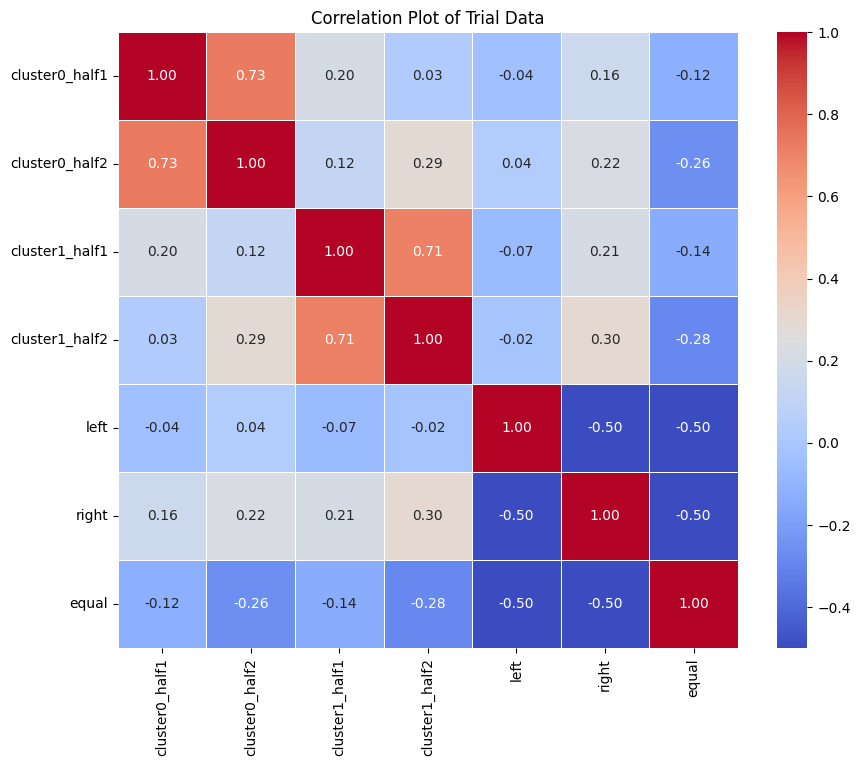

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

corr = subset_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot of Trial Data')
plt.show()

In [ ]:
# looking at the plot, it seems like none of our data is very good at predicting left

In [113]:
from sklearn.model_selection import train_test_split

X_train = subset_data.drop(columns=['left', 'right', 'equal', 'names'])
y_train = subset_data[['left', 'right', 'equal']]


print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)


X_train shape: (3651, 4)
y_train shape: (3651, 3)


fold number 1/5
Epoch 1/200
89/92 [============================>.] - ETA: 0s - loss: 1.0629 - accuracy: 0.4098
Epoch 1: val_accuracy improved from -inf to 0.46027, saving model to best_model_fold.h5
92/92 [==============================] - 4s 17ms/step - loss: 1.0635 - accuracy: 0.4116 - val_loss: 1.0189 - val_accuracy: 0.4603
Epoch 2/200
17/92 [====>.........................] - ETA: 0s - loss: 1.0405 - accuracy: 0.4651

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


87/92 [===========================>..] - ETA: 0s - loss: 1.0234 - accuracy: 0.4842
Epoch 2: val_accuracy improved from 0.46027 to 0.47671, saving model to best_model_fold.h5
92/92 [==============================] - 1s 8ms/step - loss: 1.0231 - accuracy: 0.4846 - val_loss: 1.0154 - val_accuracy: 0.4767
Epoch 3/200
85/92 [==========================>...] - ETA: 0s - loss: 1.0151 - accuracy: 0.4846
Epoch 3: val_accuracy improved from 0.47671 to 0.47945, saving model to best_model_fold.h5
92/92 [==============================] - 1s 8ms/step - loss: 1.0158 - accuracy: 0.4887 - val_loss: 1.0159 - val_accuracy: 0.4795
Epoch 4/200
89/92 [============================>.] - ETA: 0s - loss: 1.0129 - accuracy: 0.4926
Epoch 4: val_accuracy did not improve from 0.47945
92/92 [==============================] - 1s 7ms/step - loss: 1.0122 - accuracy: 0.4945 - val_loss: 1.0193 - val_accuracy: 0.4603
Epoch 5/200
91/92 [============================>.] - ETA: 0s - loss: 1.0068 - accuracy: 0.5034
Epoch 5: val

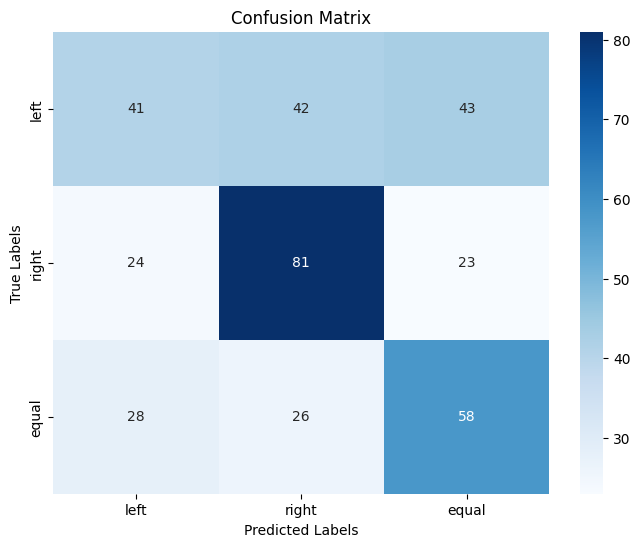

fold number 2/5
Epoch 1/200
91/92 [============================>.] - ETA: 0s - loss: 1.0599 - accuracy: 0.4265
Epoch 1: val_accuracy did not improve from 0.53699
92/92 [==============================] - 3s 16ms/step - loss: 1.0596 - accuracy: 0.4269 - val_loss: 1.0603 - val_accuracy: 0.4356
Epoch 2/200
88/92 [===========================>..] - ETA: 0s - loss: 1.0177 - accuracy: 0.4869
Epoch 2: val_accuracy did not improve from 0.53699
92/92 [==============================] - 1s 9ms/step - loss: 1.0187 - accuracy: 0.4858 - val_loss: 1.0414 - val_accuracy: 0.4712
Epoch 3/200
85/92 [==========================>...] - ETA: 0s - loss: 0.9996 - accuracy: 0.4971
Epoch 3: val_accuracy did not improve from 0.53699
92/92 [==============================] - 1s 8ms/step - loss: 1.0019 - accuracy: 0.4930 - val_loss: 1.0408 - val_accuracy: 0.4932
Epoch 4/200
88/92 [===========================>..] - ETA: 0s - loss: 1.0007 - accuracy: 0.5032
Epoch 4: val_accuracy did not improve from 0.53699
92/92 [=====

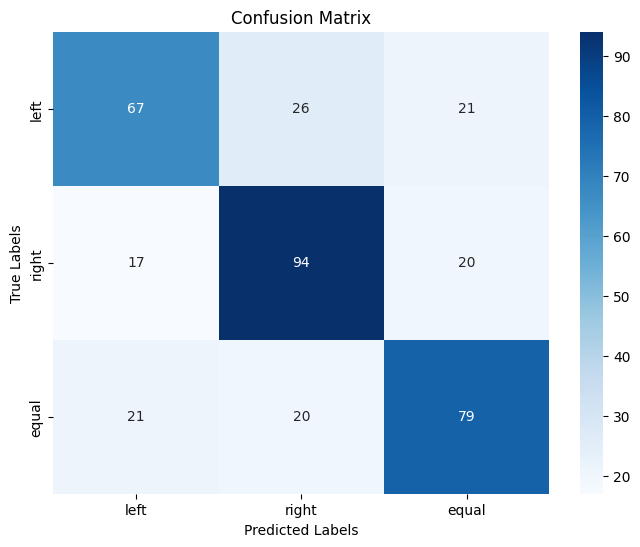

fold number 3/5
Epoch 1/200
87/92 [===========================>..] - ETA: 0s - loss: 1.0646 - accuracy: 0.4213
Epoch 1: val_accuracy did not improve from 0.53699
92/92 [==============================] - 2s 10ms/step - loss: 1.0627 - accuracy: 0.4259 - val_loss: 1.0306 - val_accuracy: 0.4548
Epoch 2/200
86/92 [===========================>..] - ETA: 0s - loss: 1.0327 - accuracy: 0.4698
Epoch 2: val_accuracy did not improve from 0.53699
92/92 [==============================] - 1s 8ms/step - loss: 1.0307 - accuracy: 0.4694 - val_loss: 1.0301 - val_accuracy: 0.4658
Epoch 3/200
92/92 [==============================] - ETA: 0s - loss: 1.0156 - accuracy: 0.4834
Epoch 3: val_accuracy did not improve from 0.53699
92/92 [==============================] - 1s 8ms/step - loss: 1.0156 - accuracy: 0.4834 - val_loss: 1.0200 - val_accuracy: 0.5014
Epoch 4/200
90/92 [============================>.] - ETA: 0s - loss: 1.0150 - accuracy: 0.4812
Epoch 4: val_accuracy did not improve from 0.53699
92/92 [=====

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


85/92 [==========================>...] - ETA: 0s - loss: 0.9527 - accuracy: 0.5305
Epoch 34: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 0.9522 - accuracy: 0.5320 - val_loss: 1.0057 - val_accuracy: 0.4959
Epoch 35/200
88/92 [===========================>..] - ETA: 0s - loss: 0.9500 - accuracy: 0.5387
Epoch 35: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 0.9477 - accuracy: 0.5402 - val_loss: 1.0097 - val_accuracy: 0.5014
Epoch 36/200
91/92 [============================>.] - ETA: 0s - loss: 0.9527 - accuracy: 0.5292
Epoch 36: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 9ms/step - loss: 0.9528 - accuracy: 0.5289 - val_loss: 1.0173 - val_accuracy: 0.5014
Epoch 37/200
92/92 [==============================] - ETA: 0s - loss: 0.9425 - accuracy: 0.5433
Epoch 37: val_accuracy did not improve from 0.53973
92/92 [===========================

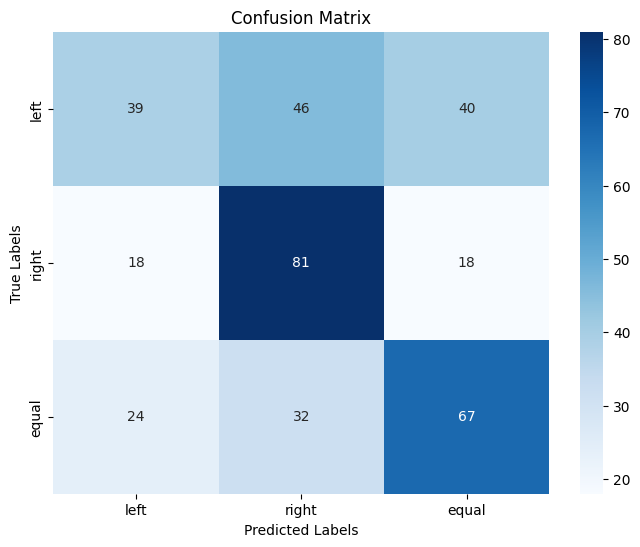

fold number 4/5
Epoch 1/200
86/92 [===========================>..] - ETA: 0s - loss: 1.0504 - accuracy: 0.4364
Epoch 1: val_accuracy did not improve from 0.53973
92/92 [==============================] - 2s 10ms/step - loss: 1.0488 - accuracy: 0.4392 - val_loss: 1.0092 - val_accuracy: 0.4658
Epoch 2/200
86/92 [===========================>..] - ETA: 0s - loss: 1.0214 - accuracy: 0.4829
Epoch 2: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 1.0232 - accuracy: 0.4824 - val_loss: 1.0034 - val_accuracy: 0.4932
Epoch 3/200
85/92 [==========================>...] - ETA: 0s - loss: 1.0122 - accuracy: 0.4963
Epoch 3: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 1.0148 - accuracy: 0.4940 - val_loss: 1.0102 - val_accuracy: 0.4658
Epoch 4/200
85/92 [==========================>...] - ETA: 0s - loss: 1.0121 - accuracy: 0.4919
Epoch 4: val_accuracy did not improve from 0.53973
92/92 [=====

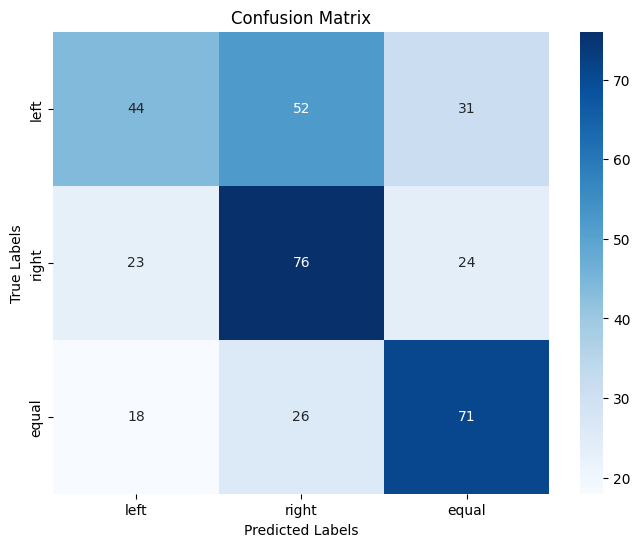

fold number 5/5
Epoch 1/200
88/92 [===========================>..] - ETA: 0s - loss: 1.0732 - accuracy: 0.3963
Epoch 1: val_accuracy did not improve from 0.53973
92/92 [==============================] - 3s 16ms/step - loss: 1.0728 - accuracy: 0.3982 - val_loss: 1.0111 - val_accuracy: 0.5096
Epoch 2/200
90/92 [============================>.] - ETA: 0s - loss: 1.0186 - accuracy: 0.4844
Epoch 2: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 1.0181 - accuracy: 0.4851 - val_loss: 1.0432 - val_accuracy: 0.4466
Epoch 3/200
87/92 [===========================>..] - ETA: 0s - loss: 1.0331 - accuracy: 0.4644
Epoch 3: val_accuracy did not improve from 0.53973
92/92 [==============================] - 1s 8ms/step - loss: 1.0298 - accuracy: 0.4687 - val_loss: 0.9968 - val_accuracy: 0.5178
Epoch 4/200
90/92 [============================>.] - ETA: 0s - loss: 1.0105 - accuracy: 0.4910
Epoch 4: val_accuracy did not improve from 0.53973
92/92 [=====

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


90/92 [============================>.] - ETA: 0s - loss: 1.0031 - accuracy: 0.4969
Epoch 8: val_accuracy did not improve from 0.54247
92/92 [==============================] - 1s 8ms/step - loss: 1.0031 - accuracy: 0.4961 - val_loss: 0.9967 - val_accuracy: 0.5178
Epoch 9/200
88/92 [===========================>..] - ETA: 0s - loss: 1.0002 - accuracy: 0.4986
Epoch 9: val_accuracy did not improve from 0.54247
92/92 [==============================] - 1s 8ms/step - loss: 0.9976 - accuracy: 0.5012 - val_loss: 0.9909 - val_accuracy: 0.5370
Epoch 10/200
87/92 [===========================>..] - ETA: 0s - loss: 0.9891 - accuracy: 0.5104
Epoch 10: val_accuracy did not improve from 0.54247
92/92 [==============================] - 1s 7ms/step - loss: 0.9905 - accuracy: 0.5080 - val_loss: 1.0028 - val_accuracy: 0.5233
Epoch 11/200
90/92 [============================>.] - ETA: 0s - loss: 0.9934 - accuracy: 0.5087
Epoch 11: val_accuracy did not improve from 0.54247
92/92 [==============================

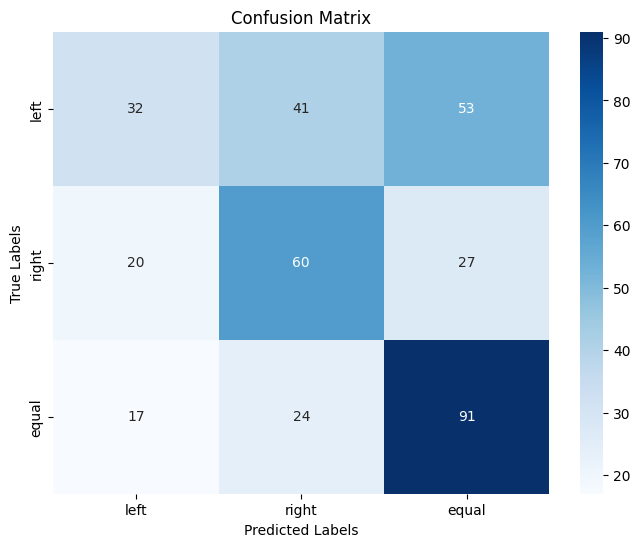

In [115]:
# using k folds because we have limited data so we want to use it all
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import KFold, train_test_split
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

num_folds = 5


kf = KFold(n_splits=num_folds, shuffle=True)
callbacks = [ModelCheckpoint("best_model_fold.h5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='max'),
             EarlyStopping(monitor='val_accuracy', patience=25, verbose=1, mode='max', restore_best_weights=True)]

all_histories = []
best_models = []
test_accs = []
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"fold number {fold_idx + 1}/{num_folds}")

    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # we will use half the val data for testing
    X_val_fold, X_test_fold, y_val_fold, y_test_fold = train_test_split(X_val_fold, y_val_fold, test_size=0.5, random_state=12)


    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(3, activation='softmax') # three output neurons to account for the 3 categories we are trying to predict
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


    history = model.fit(X_train_fold, y_train_fold,
                        epochs=200,
                        batch_size=32,
                        validation_data=(X_val_fold, y_val_fold),
                        callbacks=callbacks)

    best_model = load_model("best_model_fold.h5") # get the model the preformed best on the validation data for each fold
    best_models.append(best_model)
    test_loss, test_acc = best_model.evaluate(X_test_fold, y_test_fold)
    test_accs.append(test_acc)
    print("Test accuracy:", test_acc)
    y_pred__prob = best_model.predict(X_test_fold)
    y_true_matrix = np.matrix(y_test_fold)
    y_true = np.argmax(np.asarray(y_true_matrix), axis=1)
    y_pred_list = np.argmax(y_pred__prob, axis = 1)
    cm = confusion_matrix(y_true, y_pred_list)
    class_labels = ['left', 'right', 'equal']


    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    all_histories.append(history)





In [117]:
# I forgot to make the different testing accuracies for each of the fold into lists, but if I do it based on what was printed:

# filling these in in reverse order of the folds. see output from previous code to verify
kfolds_tests = test_accs
average_testing_accuracy = sum(kfolds_tests)/5
print(average_testing_accuracy)

print('highest k fold testing accuracy', max(kfolds_tests))
print('lowset k fold testing accuracy', min(kfolds_tests))

0.5372647523880005
highest k fold testing accuracy 0.6575342416763306
lowset k fold testing accuracy 0.49180328845977783


Some observations from the matrices, it seems like the it had a harder time determining left from right than it did identifying equal. This makes sense because on ur correlation matrix, left wasn't really correlated to any of our predictors

In [144]:
import random
my_model = random.choice(best_models)

In [145]:
X_test = test.drop(columns=['left', 'right', 'equal', 'names', 'feedback'])
y_test = test[['left', 'right', 'equal']]
y_compare = test[['feedback']]

In [149]:
test_loss, test_acc = my_model.evaluate(X_test, y_test)
print("Test accuracy:", test_acc, "test loss:", test_loss)
y_pred__prob = my_model.predict(X_test)
y_true_matrix = np.matrix(y_test)
y_true = np.argmax(np.asarray(y_true_matrix), axis=1)
y_pred_list = np.argmax(y_pred__prob, axis = 1)
print(y_pred_list)




7/7 [==============================] - 0s 4ms/step - loss: 1.2216 - accuracy: 0.4000
Test accuracy: 0.4000000059604645 test loss: 1.2215723991394043
7/7 [==============================] - 0s 3ms/step
[2 0 2 2 2 2 1 2 2 2 2 2 1 1 1 1 2 0 1 2 2 2 1 1 2 2 2 0 2 1 1 1 2 1 1 1 0
 2 1 1 0 0 0 2 1 2 1 1 2 1 1 1 1 2 1 2 1 2 0 2 2 1 1 1 1 2 1 2 2 1 2 1 2 1
 2 2 2 1 2 1 1 2 2 1 1 1 1 2 1 1 0 2 2 1 2 2 2 1 0 1 1 1 0 1 0 2 1 1 2 2 1
 2 2 2 1 2 2 2 1 1 1 2 2 1 1 2 1 1 1 1 1 2 2 1 1 1 1 0 0 0 2 2 2 2 1 1 1 2
 1 2 2 2 2 2 1 1 2 1 1 1 2 1 1 2 1 2 2 1 2 0 1 2 2 1 1 1 2 1 1 2 2 0 2 2 0
 1 1 2 2 1 1 2 2 2 1 2 1 1 1 2]


In [147]:
from sklearn.model_selection import train_test_split

X_train = train.drop(columns=['left', 'right', 'equal', 'names'])
y_train = train[['left', 'right', 'equal']]


print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

X_train shape: (4234, 4)
y_train shape: (4234, 3)


fold number 1/5
Epoch 1/200
103/106 [============================>.] - ETA: 0s - loss: 1.0511 - accuracy: 0.4493
Epoch 1: val_accuracy improved from -inf to 0.45390, saving model to best_model_fold.h5
106/106 [==============================] - 2s 11ms/step - loss: 1.0502 - accuracy: 0.4497 - val_loss: 1.0308 - val_accuracy: 0.4539
Epoch 2/200
 16/106 [===>..........................] - ETA: 0s - loss: 0.9944 - accuracy: 0.5332

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


106/106 [==============================] - ETA: 0s - loss: 1.0060 - accuracy: 0.5087
Epoch 2: val_accuracy improved from 0.45390 to 0.48936, saving model to best_model_fold.h5
106/106 [==============================] - 1s 8ms/step - loss: 1.0060 - accuracy: 0.5087 - val_loss: 1.0139 - val_accuracy: 0.4894
Epoch 3/200
104/106 [============================>.] - ETA: 0s - loss: 0.9975 - accuracy: 0.5162
Epoch 3: val_accuracy improved from 0.48936 to 0.51064, saving model to best_model_fold.h5
106/106 [==============================] - 1s 8ms/step - loss: 0.9996 - accuracy: 0.5140 - val_loss: 1.0228 - val_accuracy: 0.5106
Epoch 4/200
100/106 [===========================>..] - ETA: 0s - loss: 0.9941 - accuracy: 0.5116
Epoch 4: val_accuracy did not improve from 0.51064
106/106 [==============================] - 1s 8ms/step - loss: 0.9965 - accuracy: 0.5084 - val_loss: 1.0092 - val_accuracy: 0.4846
Epoch 5/200
102/106 [===========================>..] - ETA: 0s - loss: 0.9939 - accuracy: 0.512

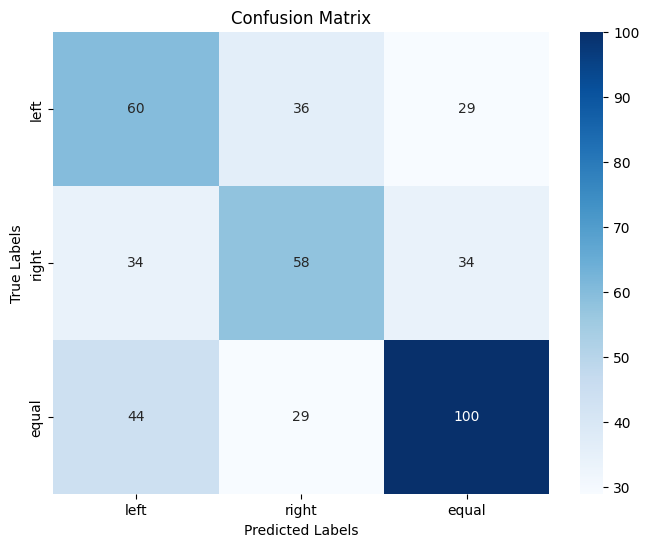

fold number 2/5
Epoch 1/200
101/106 [===========================>..] - ETA: 0s - loss: 1.0475 - accuracy: 0.4598
Epoch 1: val_accuracy did not improve from 0.56974
106/106 [==============================] - 2s 10ms/step - loss: 1.0494 - accuracy: 0.4594 - val_loss: 1.0150 - val_accuracy: 0.5106
Epoch 2/200
104/106 [============================>.] - ETA: 0s - loss: 1.0150 - accuracy: 0.4931
Epoch 2: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 1.0156 - accuracy: 0.4922 - val_loss: 0.9988 - val_accuracy: 0.5130
Epoch 3/200
101/106 [===========================>..] - ETA: 0s - loss: 1.0065 - accuracy: 0.5050
Epoch 3: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 1.0052 - accuracy: 0.5066 - val_loss: 1.0009 - val_accuracy: 0.5154
Epoch 4/200
101/106 [===========================>..] - ETA: 0s - loss: 1.0016 - accuracy: 0.4997
Epoch 4: val_accuracy did not improve from 0.5697

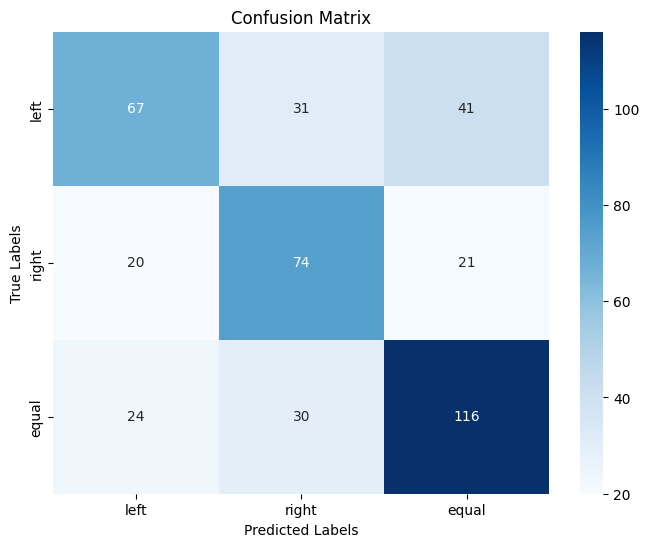

fold number 3/5
Epoch 1/200
100/106 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.4597
Epoch 1: val_accuracy did not improve from 0.56974
106/106 [==============================] - 3s 13ms/step - loss: 1.0496 - accuracy: 0.4600 - val_loss: 1.0100 - val_accuracy: 0.5059
Epoch 2/200
105/106 [============================>.] - ETA: 0s - loss: 1.0077 - accuracy: 0.5036
Epoch 2: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 1.0089 - accuracy: 0.5031 - val_loss: 1.0318 - val_accuracy: 0.4704
Epoch 3/200
104/106 [============================>.] - ETA: 0s - loss: 1.0077 - accuracy: 0.4988
Epoch 3: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 1.0078 - accuracy: 0.4996 - val_loss: 1.0295 - val_accuracy: 0.4917
Epoch 4/200
101/106 [===========================>..] - ETA: 0s - loss: 0.9998 - accuracy: 0.5102
Epoch 4: val_accuracy did not improve from 0.5697

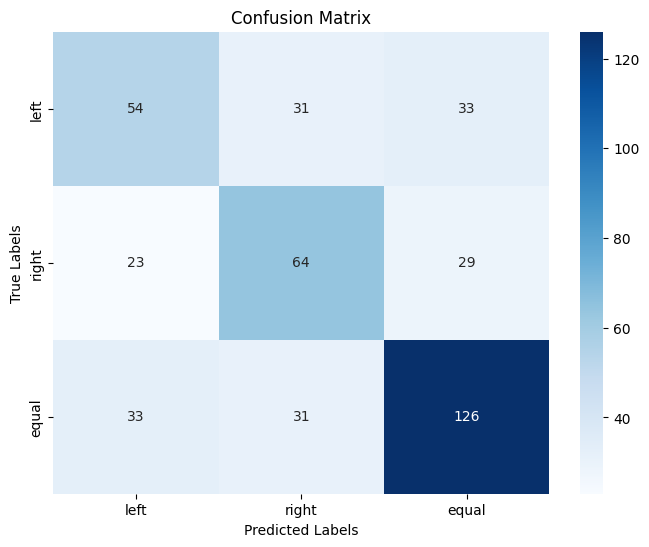

fold number 4/5
Epoch 1/200
101/106 [===========================>..] - ETA: 0s - loss: 1.0399 - accuracy: 0.4641
Epoch 1: val_accuracy did not improve from 0.56974
106/106 [==============================] - 2s 11ms/step - loss: 1.0396 - accuracy: 0.4627 - val_loss: 1.0490 - val_accuracy: 0.4681
Epoch 2/200
101/106 [===========================>..] - ETA: 0s - loss: 1.0065 - accuracy: 0.4997
Epoch 2: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 1.0048 - accuracy: 0.5016 - val_loss: 1.0413 - val_accuracy: 0.4823
Epoch 3/200
100/106 [===========================>..] - ETA: 0s - loss: 0.9903 - accuracy: 0.5216
Epoch 3: val_accuracy did not improve from 0.56974
106/106 [==============================] - 1s 8ms/step - loss: 0.9947 - accuracy: 0.5173 - val_loss: 1.0187 - val_accuracy: 0.4870
Epoch 4/200
106/106 [==============================] - ETA: 0s - loss: 0.9872 - accuracy: 0.5217
Epoch 4: val_accuracy did not improve from 0.5697

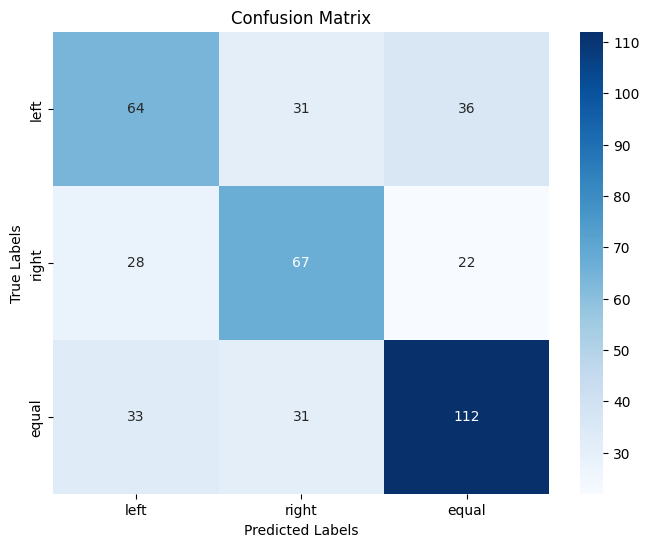

fold number 5/5
Epoch 1/200
105/106 [============================>.] - ETA: 0s - loss: 1.0543 - accuracy: 0.4476
Epoch 1: val_accuracy did not improve from 0.56974
106/106 [==============================] - 3s 19ms/step - loss: 1.0541 - accuracy: 0.4475 - val_loss: 1.0175 - val_accuracy: 0.4799
Epoch 2/200
104/106 [============================>.] - ETA: 0s - loss: 1.0213 - accuracy: 0.4868
Epoch 2: val_accuracy did not improve from 0.56974
106/106 [==============================] - 2s 18ms/step - loss: 1.0211 - accuracy: 0.4864 - val_loss: 0.9847 - val_accuracy: 0.5106
Epoch 3/200
106/106 [==============================] - ETA: 0s - loss: 1.0072 - accuracy: 0.5015
Epoch 3: val_accuracy did not improve from 0.56974
106/106 [==============================] - 2s 16ms/step - loss: 1.0072 - accuracy: 0.5015 - val_loss: 0.9900 - val_accuracy: 0.5414
Epoch 4/200
106/106 [==============================] - ETA: 0s - loss: 0.9997 - accuracy: 0.5071
Epoch 4: val_accuracy did not improve from 0.56

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


101/106 [===========================>..] - ETA: 0s - loss: 0.9294 - accuracy: 0.5588
Epoch 50: val_accuracy did not improve from 0.58156
106/106 [==============================] - 1s 8ms/step - loss: 0.9277 - accuracy: 0.5611 - val_loss: 0.9591 - val_accuracy: 0.5485
Epoch 51/200
106/106 [==============================] - ETA: 0s - loss: 0.9359 - accuracy: 0.5584
Epoch 51: val_accuracy did not improve from 0.58156
106/106 [==============================] - 1s 8ms/step - loss: 0.9359 - accuracy: 0.5584 - val_loss: 0.9455 - val_accuracy: 0.5579
Epoch 52/200
102/106 [===========================>..] - ETA: 0s - loss: 0.9239 - accuracy: 0.5613
Epoch 52: val_accuracy did not improve from 0.58156
106/106 [==============================] - 1s 8ms/step - loss: 0.9271 - accuracy: 0.5602 - val_loss: 0.9504 - val_accuracy: 0.5745
Epoch 53/200
100/106 [===========================>..] - ETA: 0s - loss: 0.9198 - accuracy: 0.5681
Epoch 53: val_accuracy did not improve from 0.58156
106/106 [===========

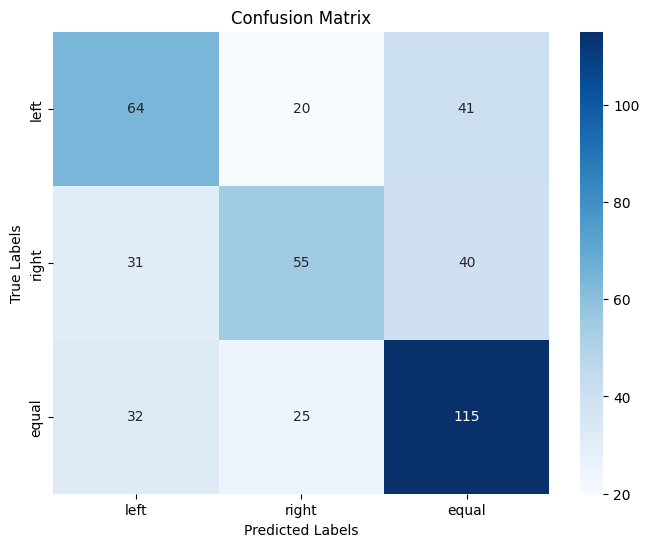

In [148]:
# using k folds because we have limited data so we want to use it all
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import KFold, train_test_split
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

num_folds = 5


kf = KFold(n_splits=num_folds, shuffle=True)
callbacks = [ModelCheckpoint("best_model_fold.h5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='max'),
             EarlyStopping(monitor='val_accuracy', patience=25, verbose=1, mode='max', restore_best_weights=True)]

all_histories = []
best_models = []
test_accs = []
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"fold number {fold_idx + 1}/{num_folds}")

    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # we will use half the val data for testing
    X_val_fold, X_test_fold, y_val_fold, y_test_fold = train_test_split(X_val_fold, y_val_fold, test_size=0.5, random_state=12)


    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256, activation='relu'),
        Dense(3, activation='softmax') # three output neurons to account for the 3 categories we are trying to predict
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


    history = model.fit(X_train_fold, y_train_fold,
                        epochs=200,
                        batch_size=32,
                        validation_data=(X_val_fold, y_val_fold),
                        callbacks=callbacks)

    best_model = load_model("best_model_fold.h5") # get the model the preformed best on the validation data for each fold
    best_models.append(best_model)
    test_loss, test_acc = best_model.evaluate(X_test_fold, y_test_fold)
    test_accs.append(test_acc)
    print("Test accuracy:", test_acc)
    y_pred__prob = best_model.predict(X_test_fold)
    y_true_matrix = np.matrix(y_test_fold)
    y_true = np.argmax(np.asarray(y_true_matrix), axis=1)
    y_pred_list = np.argmax(y_pred__prob, axis = 1)
    cm = confusion_matrix(y_true, y_pred_list)
    class_labels = ['left', 'right', 'equal']


    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    all_histories.append(history)

In [150]:
kfolds_tests = test_accs
average_testing_accuracy = sum(kfolds_tests)/5
print(average_testing_accuracy)

print('highest k fold testing accuracy', max(kfolds_tests))
print('lowset k fold testing accuracy', min(kfolds_tests))

0.5644118785858154
highest k fold testing accuracy 0.6061320900917053
lowset k fold testing accuracy 0.5141509175300598


In [175]:
final_accs = []
for model in range(len(best_models)): # iterate through 5 to make sure we use all train data

  my_modelFULL = best_models[model]
  y_pred__prob = my_modelFULL.predict(X_test, verbose = 0)
  y_true_matrix = np.matrix(y_test)
  y_true = np.argmax(np.asarray(y_true_matrix), axis=1)
  y_pred_list = np.argmax(y_pred__prob, axis = 1)
  pred_feedbacks = []
  for i in range(len(y_pred_list)):
    if y_pred_list[i] != y_true[i]:
      pred_feedbacks.append(0)
    else:
      pred_feedbacks.append(1)
    true_list = y_compare['feedback'].tolist()

  accuracy = (sum(pred_feedbacks))/sum(true_list) # in case there are 0
  print('accuracy for this model (each model trained on different training and valiadation fold) ', accuracy) # number of predicted successes

  final_accs.append(accuracy)

import statistics


print('average final accuracy: ', np.mean(final_accs), 'sd: ', statistics.stdev(final_accs), 'max: ', max(final_accs))

accuracy for this model (each model trained on different training and valiadation fold)  0.5241379310344828
accuracy for this model (each model trained on different training and valiadation fold)  0.5241379310344828
accuracy for this model (each model trained on different training and valiadation fold)  0.5241379310344828
accuracy for this model (each model trained on different training and valiadation fold)  0.5241379310344828
accuracy for this model (each model trained on different training and valiadation fold)  0.503448275862069
average final accuracy:  0.52 sd:  0.009252695079309493 max:  0.5241379310344828


In [153]:
# get predictions based on whether of not my models prediction for what the mouse saw corresponds with the actual experimetal condition
pred_feedbacks = []
for i in range(len(y_pred_list)):
    if y_pred_list[i] != y_true[i]:
      pred_feedbacks.append(0)
    else: pred_feedbacks.append(1)




In [154]:
y_compare # this is our true feedback labels

,feedback
0,1.0
1,0.0
2,1.0
3,1.0
4,1.0
...,...
195,0.0
196,1.0
197,1.0
198,1.0


In [159]:
true_list = y_compare['feedback'].tolist()
print(sum(true_list)) # number of true successes
print(sum(pred_feedbacks)) # number of predicted successes

145.0
76


In [160]:
76/145

0.5241379310344828